In [424]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import patches
import seaborn as sns

import warnings

# Statistics functions
from scipy.stats import norm
from scipy import stats
from scipy.stats import chi2_contingency
from scipy.stats import chi2

In [425]:
# Suppressing a warning 
warnings.filterwarnings("ignore") 

# It is a magic function that renders the figure in the notebook
%matplotlib inline 

# Changing the figure size of a seaborn axes 
sns.set(rc={"figure.figsize": (10, 6)})

# The style parameters control properties like the color of the background and whether a grid is enabled by default.
sns.set_style("whitegrid")

# To display maximum columns
pd.set_option('display.max_columns', None)

# To display maximum rows
pd.set_option('display.max_rows', 200)

# Examining Data

In [426]:
df= pd.read_csv("train_cleaned.csv") # reading the train_cleaned.csv data

In [427]:
df.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score
0,5634,3392,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3.0,4,3,7.0,11.27,4.0,Good,809.98,26.822620,265,No,49.574949,80.415295,312.494089,Good
1,5635,3392,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3.0,4,-1,4.0,11.27,4.0,Good,809.98,31.944960,266,No,49.574949,118.280222,284.629162,Good
2,5636,3392,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,1824.843333,3,4,3.0,4,3,7.0,11.27,4.0,Good,809.98,28.609352,267,No,49.574949,81.699521,331.209863,Good
3,5637,3392,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3.0,4,5,4.0,6.27,4.0,Good,809.98,31.377862,268,No,49.574949,199.458074,223.451310,Good
4,5638,3392,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3.0,4,6,4.0,11.27,4.0,Good,809.98,24.797347,269,No,49.574949,41.420153,341.489231,Good


In [428]:
# Creating a copy from df named df_copy

df_copy = df.copy()

## Checking the summary information of df

In [429]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 26 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  int64  
 1   Customer_ID               100000 non-null  int64  
 2   Month                     100000 non-null  object 
 3   Name                      100000 non-null  object 
 4   Age                       100000 non-null  int64  
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  float64
 8   Monthly_Inhand_Salary     100000 non-null  float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  float64
 12  Num_of_Loan               100000 non-null  int64  
 13  Delay_from_due_date       100000 non-null  in

In [430]:
# Checking the null values of df

df.isnull().sum()

ID                          0
Customer_ID                 0
Month                       0
Name                        0
Age                         0
SSN                         0
Occupation                  0
Annual_Income               0
Monthly_Inhand_Salary       0
Num_Bank_Accounts           0
Num_Credit_Card             0
Interest_Rate               0
Num_of_Loan                 0
Delay_from_due_date         0
Num_of_Delayed_Payment      0
Changed_Credit_Limit        0
Num_Credit_Inquiries        0
Credit_Mix                  0
Outstanding_Debt            0
Credit_Utilization_Ratio    0
Credit_History_Age          0
Payment_of_Min_Amount       0
Total_EMI_per_month         0
Amount_invested_monthly     0
Monthly_Balance             0
Credit_Score                0
dtype: int64

In [431]:
# Checking the duplicated values in df

df.duplicated().sum()

0

In [432]:
# Checking the number of uniques in df

df.nunique()

ID                          100000
Customer_ID                  12500
Month                            8
Name                         10139
Age                           1728
SSN                          12500
Occupation                      15
Annual_Income                13487
Monthly_Inhand_Salary        13235
Num_Bank_Accounts              943
Num_Credit_Card               1179
Interest_Rate                 1750
Num_of_Loan                    414
Delay_from_due_date             73
Num_of_Delayed_Payment         711
Changed_Credit_Limit          4375
Num_Credit_Inquiries          1223
Credit_Mix                       3
Outstanding_Debt             12203
Credit_Utilization_Ratio    100000
Credit_History_Age             406
Payment_of_Min_Amount            3
Total_EMI_per_month          14950
Amount_invested_monthly      91594
Monthly_Balance              99689
Credit_Score                     3
dtype: int64

# Handling With Outliers

## Handling with outliers for numerical features

In [433]:
# Creating a df_numeric contains only numerical features

df_numeric = df.select_dtypes(exclude=["object"])

In [434]:
# Checking the information about df_numeric

df_numeric.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 19 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  int64  
 1   Customer_ID               100000 non-null  int64  
 2   Age                       100000 non-null  int64  
 3   Annual_Income             100000 non-null  float64
 4   Monthly_Inhand_Salary     100000 non-null  float64
 5   Num_Bank_Accounts         100000 non-null  int64  
 6   Num_Credit_Card           100000 non-null  int64  
 7   Interest_Rate             100000 non-null  float64
 8   Num_of_Loan               100000 non-null  int64  
 9   Delay_from_due_date       100000 non-null  int64  
 10  Num_of_Delayed_Payment    100000 non-null  float64
 11  Changed_Credit_Limit      100000 non-null  float64
 12  Num_Credit_Inquiries      100000 non-null  float64
 13  Outstanding_Debt          100000 non-null  fl

In [435]:
# Checking the desciptive values in df

df_numeric.describe()

,ID,Customer_ID,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
count,100000.000000,100000.000000,100000.000000,1.000000e+05,100000.000000,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,80631.500000,25982.666640,110.649700,1.764157e+05,4198.771619,17.091280,22.47443,72.466040,3.009960,21.068780,29.687860,10.389303,27.700090,1426.220376,32.285173,219.371440,1403.118217,617.257610,402.755490
std,43301.486619,14340.543051,686.244717,1.429618e+06,3187.494355,117.404834,129.05741,466.422621,62.647879,14.860104,218.027514,6.789784,192.889529,1155.129026,5.116875,101.273089,8306.041270,1999.677146,214.452855
min,5634.000000,1006.000000,-500.000000,7.005930e+03,303.645417,-1.000000,0.00000,1.000000,-100.000000,-5.000000,-3.000000,-6.490000,0.000000,0.230000,20.000000,-1.000000,0.000000,0.000000,0.007760
25%,43132.750000,13664.500000,24.000000,1.945750e+04,1626.761667,3.000000,4.00000,8.000000,1.000000,10.000000,9.000000,5.320000,3.000000,566.072500,28.052567,142.000000,30.306660,75.356284,269.937870
50%,80631.500000,25777.000000,33.000000,3.757861e+04,3096.378333,6.000000,5.00000,13.000000,3.000000,18.000000,14.000000,9.400000,6.000000,1166.155000,32.305784,219.000000,69.249473,136.173912,336.898504
75%,118130.250000,38385.000000,42.000000,7.279092e+04,5961.745000,7.000000,7.00000,20.000000,5.000000,28.000000,18.000000,14.860000,9.000000,1945.962500,36.496663,301.000000,161.224249,263.231662,471.138097
max,155629.000000,50999.000000,8698.000000,2.419806e+07,15204.633333,1798.000000,1499.00000,5797.000000,1496.000000,67.000000,4397.000000,36.970000,2597.000000,4998.070000,50.000000,404.000000,82331.000000,10000.000000,1602.040519


### Histplots for numerical features

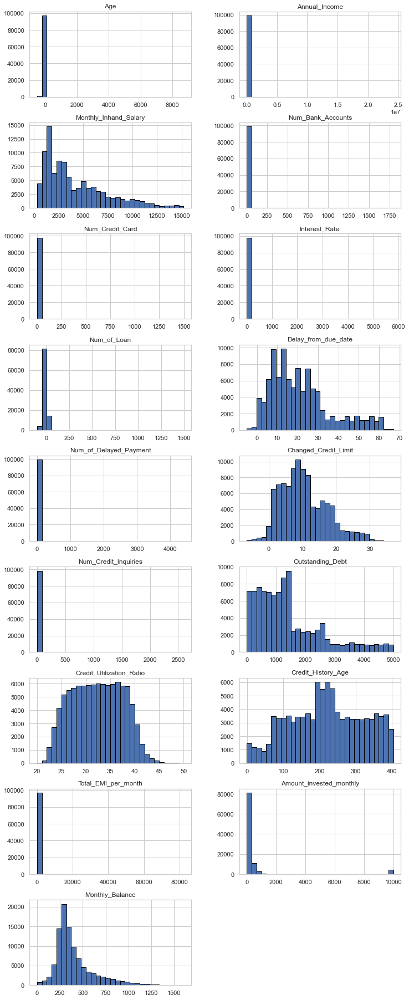

In [436]:
fig_ = df_numeric.iloc[:,2:].hist(figsize=(12, 36), layout=(10,2), bins=30, edgecolor="black");

### Box plots for numeric columns

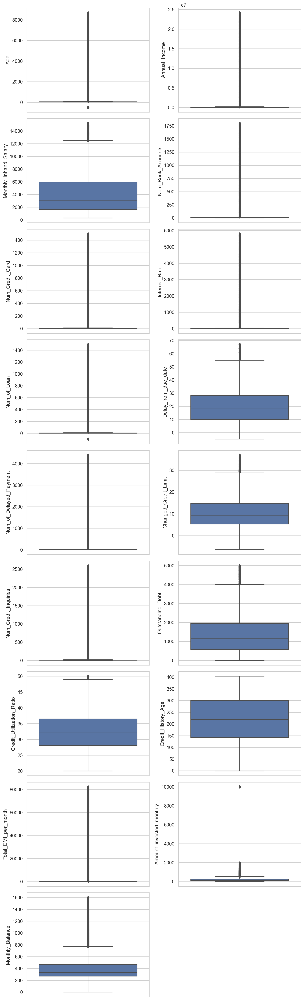

In [437]:
fig = plt.figure(figsize=(10,36), dpi=200)
for i, col in enumerate(df_numeric.iloc[:,2:].columns):
        plt.subplot(10,2,i+1)
        sns.boxplot(y=col, data=df_numeric.iloc[:,2:])
plt.tight_layout();

### Boxplots for numeric columns by grouping Credit Score

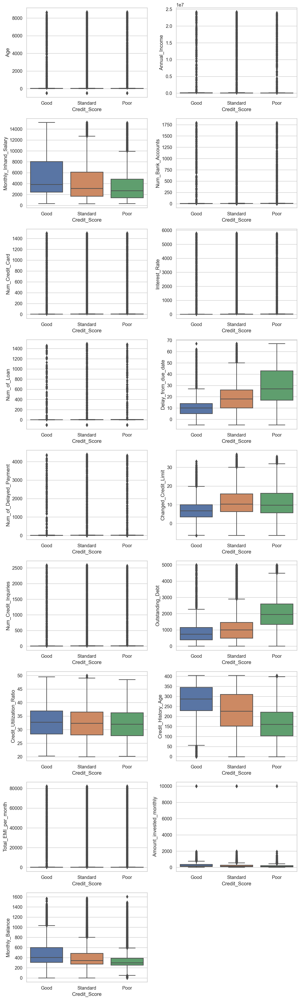

In [438]:
fig = plt.figure(figsize=(10,36), dpi=200)
for i, col in enumerate(df_numeric.iloc[:,2:].columns):
        plt.subplot(10,2,i+1)
        sns.boxplot(x= "Credit_Score", y=col, data=df)
plt.tight_layout();

### Conclusion about plots of numeric columns

When we examine the graphs above, it has been evaluated that there may be extreme values in the columns given below.

Age

Annual_Income

Monthly_Inhand_Salary

Num_Bank_Accounts

Num_Credit_Card

Interest_Rate

Num_of_Loan

Num_of_Delayed_Payment

Num_Credit_Inquiries

Total_EMI_per_month

Amount_invested_monthly

First of all, extreme values in these columns will be studied.

### Defining a function to find iqr lower, upper limits and the number of extreme values

In [439]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 26 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  int64  
 1   Customer_ID               100000 non-null  int64  
 2   Month                     100000 non-null  object 
 3   Name                      100000 non-null  object 
 4   Age                       100000 non-null  int64  
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  float64
 8   Monthly_Inhand_Salary     100000 non-null  float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  float64
 12  Num_of_Loan               100000 non-null  int64  
 13  Delay_from_due_date       100000 non-null  in

In [440]:
def iqr_lower_upper (col) :
    global lower, upper
    q1 = df_numeric[col].quantile(0.25)
    q3 = df_numeric[col].quantile(0.75)
    iqr = q3 -q1
    lower = round(q1 -1.5*iqr, 2)
    upper = round(q3 + 1.5*iqr, 2)
    nr_extreme = df.loc[(df[col] < lower) | (df[col] > upper)].shape[0] 
    print(f"lower limit : {lower}\nupper limit: {upper}\nthe number of extreme values outside the lower and upper limits : {nr_extreme}")

### Age column

In [441]:
# Finding iqr lower and upper limit of Age column

iqr_lower_upper("Age")

lower limit : -3.0
upper limit: 69.0
the number of extreme values outside the lower and upper limits : 2781


In [442]:
# Checking the value counts of Age column by grouping Customer_ID

df.groupby("Customer_ID")["Age"].value_counts().head(50)

Customer_ID  Age  
1006          38      6
              37      1
              8153    1
1007          48      8
1008          37      7
              3452    1
1009          22      7
              23      1
1011          44      7
              43      1
1013          30      8
1014          55      6
              56      2
1015          25      8
1017          27      8
1019          30      5
              31      3
1029          31      7
             -500     1
1030          33      7
             -500     1
1036          45      7
              46      1
1037          43      7
              42      1
1039          35      8
1041          43      5
              44      2
              2546    1
1043          23      5
              22      3
1045          28      6
              27      2
1046          25      6
              24      2
1048          32      8
1050          52      8
1052          50      8
1060          22      7
             -500     1
1061          45     

In [443]:
# checking the extreme values outside the lower and upper limits by sorting the Age value

df[(df.Age < lower)|(df.Age > upper)][["Age"]].value_counts(dropna=False).sort_index()

Age  
-500     886
 95        3
 99        1
 100       1
 102       1
        ... 
 8674      1
 8678      1
 8682      1
 8697      1
 8698      1
Length: 1685, dtype: int64

**According to the  analysis above the extreme values in Age column outside the lower and upper limits should be replaced with np.nan. Then null values can be filled with ffill and bfill method.**

In [444]:
# Replacing extreme values in Age column with np.nan

df["Age"] = df.Age.replace([df[(df.Age > upper) | (df.Age < 0)]["Age"]], np.nan)

In [445]:
# Filling null values with ffill and bfill method by grouping Customer_ID

df["Age"] = df.groupby("Customer_ID")["Age"].fillna(method="ffill").fillna(method="bfill").astype(int)

In [446]:
# Checking the null values after filling process

df.Age.isnull().sum()

0

### Annual_Income column

In [447]:
# Finding iqr lower and upper limit of Annual_Income column

iqr_lower_upper("Annual_Income")

lower limit : -60542.63
upper limit: 152791.05
the number of extreme values outside the lower and upper limits : 2783


In [448]:
# Checking the value counts of Annual_Income column by grouping Customer_ID

df.groupby("Customer_ID")["Annual_Income"].value_counts().head(50)

Customer_ID  Annual_Income
1006         1.675618e+04     8
1007         2.121291e+04     8
1008         3.354043e+04     8
1009         8.098364e+04     8
1011         1.041426e+05     8
1013         3.002271e+04     8
1014         6.024472e+04     8
1015         2.610448e+04     8
1017         1.806064e+04     8
1019         1.443287e+04     8
1029         2.094288e+04     6
             1.102648e+07     1
             1.570886e+07     1
1030         1.229423e+05     8
1036         2.088458e+04     8
1037         1.790815e+04     8
1039         7.258899e+04     8
1041         1.122875e+05     8
1043         4.180616e+04     8
1045         7.534185e+03     8
1046         1.764146e+04     8
1048         1.492412e+04     8
1050         2.775932e+04     8
1052         1.880834e+04     8
1060         3.075843e+04     8
1061         6.057270e+04     8
1066         6.492304e+04     8
1071         3.636668e+04     8
1073         2.080474e+04     8
1074         1.418048e+04     8
1079         

In [449]:
# checking the extreme values outside the lower and upper limits by sorting the Annual_Income value

df[(df.Annual_Income < lower)|(df.Annual_Income > upper)][["Annual_Income"]].value_counts(dropna=False).sort_index()

Annual_Income
152796.76        8
152895.44        8
152947.12        8
153147.64        8
154242.48        8
                ..
24105369.00      1
24160009.00      1
24177153.00      1
24188807.00      1
24198062.00      1
Length: 1224, dtype: int64

In [450]:
# Checking the Annual_Income value less than 0

df[(df.Annual_Income < 0)][["Annual_Income"]].count()

Annual_Income    0
dtype: int64

In [451]:
# Checking the customer information whose Annual_Income value is greater than upper limit

df[(df.Annual_Income > upper)] 

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score
54,5712,10314,July,Nadiaq,34,411-51-0676,Lawyer,10909427.0,10469.207759,0,1,8.0,2,0,2.0,9.34,4.0,Good,352.16,26.947565,373,No,911.220179,930.391898,326.241830,Good
231,5977,49150,August,Dhanya Skariachano,40,311-13-7309,Architect,6515990.0,2210.032500,6,3,15.0,3,25,12.0,4.89,2.0,Standard,400.07,23.177617,370,Yes,69.602920,51.830859,339.569471,Standard
245,5999,39537,June,Mukhopadhyayc,55,889-07-2357,Scientist,586359.0,1684.168333,1,5,1.0,2,5,7.0,6.83,4.0,Good,413.32,28.836349,224,No,29.534584,68.956725,319.925525,Good
361,6175,36507,February,Rachelle Younglaic,15,925-51-5335,Entrepreneur,18334118.0,4369.482500,10,10,18.0,8,30,18.0,20.99,11.0,Bad,3422.49,36.729939,126,Yes,314.901785,124.541470,257.504994,Standard
368,6186,24733,January,Shupingu,27,911-47-6879,Architect,19717385.0,1057.435833,7,10,33.0,9,59,24.0,8.82,11.0,Bad,2797.17,25.314339,167,Yes,58.868441,60.550786,246.324357,Standard
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99664,155130,2825,January,Lianau,31,228-47-4867,Lawyer,5794377.0,12124.556667,5,4,9.0,1,3,10.0,11.48,1.0,Good,928.28,38.616320,265,No,72.250125,169.356592,1210.848950,Standard
99714,155204,44477,March,Scotts,26,864-24-3672,Doctor,11712577.0,2799.830833,5,6,8.0,4,10,11.0,9.92,0.0,Good,82.15,30.711678,277,No,113.833391,121.492500,334.657193,Standard
99721,155215,4551,February,raden Reddallh,53,646-19-1493,Architect,8544730.0,3198.161667,5,4,5.0,3,9,6.0,3.98,2.0,Good,1019.46,26.702382,200,No,86.809918,117.838682,365.167567,Standard
99882,155456,18426,March,Yantoultra Nguif,31,291-51-7240,Mechanic,16884797.0,5440.945000,7,3,1947.0,0,7,8.0,12.57,2.0,Standard,330.60,38.524095,276,Yes,0.000000,10000.000000,536.342920,Standard


In [452]:
# Checking the Annual_Income value for Customer_ID = 10314

df[df.Customer_ID == 10314][["Customer_ID","Annual_Income"]]

,Customer_ID,Annual_Income
48,10314,131313.4
49,10314,131313.4
50,10314,131313.4
51,10314,131313.4
52,10314,131313.4
53,10314,131313.4
54,10314,10909427.0
55,10314,131313.4


In [453]:
#Checking the Annual_Income value for Customer_ID = 36507

df[df.Customer_ID == 36507][["Customer_ID","Annual_Income"]]

,Customer_ID,Annual_Income
360,36507,55829.79
361,36507,18334118.00
362,36507,55829.79
363,36507,55829.79
364,36507,55829.79
365,36507,55829.79
366,36507,55829.79
367,36507,55829.79


**According to the  analysis above the extreme values in Annual_Income column outside the 0 and upper limits should be replaced with np.nan. Then null values can be filled with ffill and bfill method.**

In [454]:
# Replacing extreme values in Annual_Income column with np.nan

df["Annual_Income"] = df.Annual_Income.replace([df[(df.Annual_Income > upper) | (df.Annual_Income < 0)]["Annual_Income"]], np.nan)

In [455]:
# Filling null values with ffill and bfill method by grouping Customer_ID

df["Annual_Income"] = df.groupby("Customer_ID")["Annual_Income"].fillna(method="ffill").fillna(method="bfill")

In [456]:
# Checking the null values after filling process

df.Age.isnull().sum()

0

### Monthly_Inhand_Salary

In [457]:
# Finding iqr lower and upper limit of Monthly_Inhand_Salary column

iqr_lower_upper("Monthly_Inhand_Salary")

lower limit : -4875.71
upper limit: 12464.22
the number of extreme values outside the lower and upper limits : 2009


In [458]:
# Checking the value counts of Monthly_Inhand_Salary column by grouping Customer_ID

df.groupby("Customer_ID")["Monthly_Inhand_Salary"].value_counts().head(50)

Customer_ID  Monthly_Inhand_Salary
1006         1331.348333              8
1007         1496.742500              8
1008         2655.035833              8
1009         6692.636667              8
1011         8433.546667              8
1013         2684.892500              8
1014         5197.393333              8
1015         1995.373333              8
1017         1280.053333              8
1019         1185.739167              8
1029         1671.240000              8
1030         10205.190000             8
1036         1855.381667              8
1037         1748.345833              8
1039         6242.082500              8
1041         9097.292500              8
1043         3564.846667              8
1045         892.848750               8
1046         1703.121667              8
1048         1347.676667              8
1050         2419.276667              8
1052         1618.361667              8
1060         2822.202500              8
1061         4844.725000              8
1066 

In [459]:
# checking the extreme values outside the upper limit by sorting the Monthly_Inhand_Salary value

df[(df.Monthly_Inhand_Salary > upper)][["Monthly_Inhand_Salary"]].value_counts(dropna=False).sort_index()

Monthly_Inhand_Salary
12474.846667             8
12482.563333             8
12492.836667             8
12495.470000             8
12513.113333             5
                        ..
15101.940000             8
15115.190000             8
15136.696667             8
15167.180000             8
15204.633333             8
Length: 263, dtype: int64

In [460]:
# Checking the Monthly_Inhand_Salary value less than 0

df[(df.Monthly_Inhand_Salary < 0)][["Monthly_Inhand_Salary"]].count()

Monthly_Inhand_Salary    0
dtype: int64

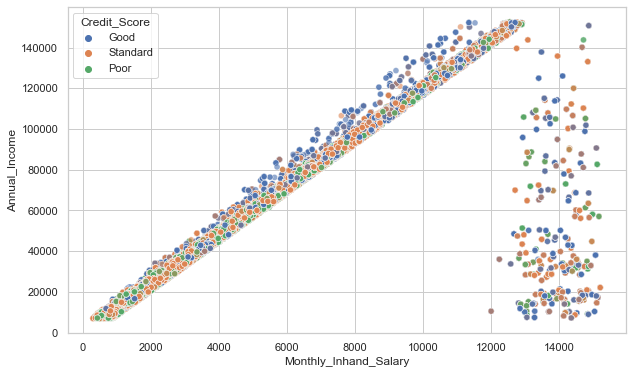

In [461]:
# Checking the scatterplot of Monthly_Inhand_Salary and Annual_Income to determine outlier limits

sns.scatterplot(x=df.Monthly_Inhand_Salary, y= df.Annual_Income, data=df, hue="Credit_Score", alpha=0.6);

In [462]:
# As it is seen from the scatterplot there are strong correlations between Monthly_Inhand_Salary and Annual_Income and
# it was concluded that Monthly_Inhand_Salary value greater or equal to 11900 and Annual_Income value less than 120000 are outliers.
# So out of these values can be dropped from df.

df[(df.Monthly_Inhand_Salary >= 11900) & (df.Annual_Income < 120000)].Customer_ID.value_counts()

11313    8
3023     8
26053    8
1551     8
13830    8
        ..
9981     8
9620     8
42083    8
39046    8
8087     8
Name: Customer_ID, Length: 214, dtype: int64

In [463]:
df[df.Customer_ID == 37775] # The Annual_Income can't be less than Monthly_Inhand_Salary! It should be dropped.  

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score
13080,25254,37775,January,Philips,21,723-42-6455,Teacher,10563.445,13280.543333,3,3,5.0,3,0,7.0,9.97,0.0,Good,362.01,30.573804,275,No,301.568748,196.097700,1070.387886,Good
13081,25255,37775,February,Philips,21,723-42-6455,Teacher,10563.445,13280.543333,3,3,5.0,3,0,9.0,9.97,0.0,Good,362.01,40.694082,276,No,301.568748,277.602473,988.883113,Good
13082,25256,37775,March,Philips,21,723-42-6455,Teacher,10563.445,13280.543333,3,3,5.0,3,0,8.0,9.97,0.0,Good,362.01,33.897195,277,No,301.568748,544.115453,732.370132,Good
13083,25257,37775,April,Philips,21,723-42-6455,Teacher,10563.445,11999.787525,3,3,5.0,3,0,7.0,9.97,0.0,Good,362.01,22.546259,278,No,1582.324556,1124.119301,182.366285,Good
13084,25258,37775,May,Philips,21,723-42-6455,Teacher,10563.445,11999.787525,3,3,5.0,3,0,7.0,9.97,0.0,Good,362.01,41.990601,279,No,1582.324556,332.820967,933.664619,Good
13085,25259,37775,June,Philips,21,723-42-6455,Teacher,10563.445,11999.787525,3,3,5.0,3,0,10.0,9.97,0.0,Good,362.01,45.262078,280,NM,1582.324556,179.028725,1087.456861,Good
13086,25260,37775,July,Philips,21,723-42-6455,Teacher,10563.445,11999.787525,3,3,5.0,3,0,7.0,9.97,0.0,Good,362.01,41.196422,281,NM,1582.324556,319.673408,946.812178,Good
13087,25261,37775,August,Philips,21,723-42-6455,Teacher,10563.445,11999.787525,3,3,5.0,3,5,7.0,9.97,0.0,Good,362.01,39.572395,282,No,12814.000000,870.350850,436.134735,Standard


In [464]:
# Dropping outliers

df.drop(index=df[(df.Monthly_Inhand_Salary >= 11900) & (df.Annual_Income < 120000)].index, inplace=True)

In [465]:
df.shape

(98288, 26)

### Num_Bank_Accounts

In [466]:
# Finding iqr lower and upper limit of Num_Bank_Accounts column

iqr_lower_upper("Num_Bank_Accounts")

lower limit : -3.0
upper limit: 13.0
the number of extreme values outside the lower and upper limits : 1289


In [467]:
# Checking the value counts of Num_Bank_Accounts column by grouping Customer_ID

df.groupby("Customer_ID")["Num_Bank_Accounts"].value_counts()

Customer_ID  Num_Bank_Accounts
1006         9                    8
1007         3                    7
             1174                 1
1008         6                    8
1009         6                    8
                                 ..
50990        1696                 1
50992        7                    8
50996        3                    8
50999        2                    7
             50                   1
Name: Num_Bank_Accounts, Length: 13879, dtype: int64

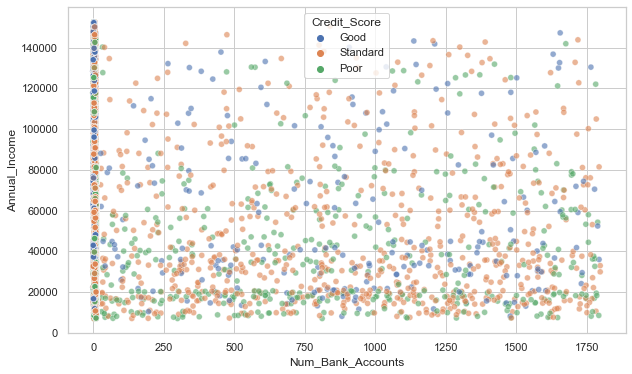

In [468]:
# Checking the scatterplot of Annual_Income and Num_Bank_Accounts to determine outliers

sns.scatterplot(x= df.Num_Bank_Accounts, y=df.Annual_Income,  data=df, hue="Credit_Score", alpha=0.6);

In [469]:
# checking the extreme values in Num_Bank_Accounts outside the lower and upper limits by sorting the Num_Bank_Accounts value

df[(df.Num_Bank_Accounts < lower)|(df.Num_Bank_Accounts > upper)][["Num_Bank_Accounts"]].value_counts(dropna=False).sort_index()

Num_Bank_Accounts
18                   1
26                   1
27                   1
28                   3
29                   1
                    ..
1786                 1
1789                 2
1793                 1
1794                 2
1798                 2
Length: 924, dtype: int64

In [470]:
# Checking the number of Num_Bank_Accounts whose Num_Bank_Accounts value less than 0

(df.Num_Bank_Accounts < 0).sum()

21

In [471]:
# Checking the customer information whose Num_Bank_Accounts value is less than 0

df[(df.Num_Bank_Accounts < 0)]

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score
30330,51128,20266,March,Margaretf,39,807-03-5415,Engineer,128305.76,10434.146667,-1,6,1.0,2,5,3.0,9.49,6.0,Good,1151.70,40.586736,269,No,196.587321,230.922386,855.904960,Standard
30331,51129,20266,April,Margaretf,40,807-03-5415,Engineer,128305.76,10434.146667,-1,6,1.0,2,5,6.0,14.49,6.0,Good,1151.70,39.369401,270,No,196.587321,524.304418,592.522928,Good
30332,51130,20266,May,Margaretf,40,807-03-5415,Engineer,128305.76,10434.146667,-1,6,1.0,2,1,8.0,9.49,6.0,Good,1151.70,28.702053,271,No,196.587321,150.096675,936.730670,Good
30333,51131,20266,June,Margaretf,40,807-03-5415,Engineer,128305.76,10434.146667,-1,6,1.0,2,5,6.0,9.49,6.0,Good,1151.70,34.808390,272,No,196.587321,1006.698069,120.129276,Good
30334,51132,20266,July,Margaretf,40,807-03-5415,Engineer,128305.76,10434.146667,-1,6,1.0,2,9,3.0,9.49,6.0,Good,1151.70,35.206427,273,No,42850.000000,172.992021,913.835324,Good
30335,51133,20266,August,Margaretf,40,807-03-5415,Engineer,128305.76,10434.146667,-1,6,1.0,2,10,6.0,9.49,6.0,Good,1151.70,38.278518,274,No,196.587321,338.672303,758.155042,Good
43689,71167,43128,February,Douwe Miedemaz,54,300-54-4627,Engineer,117851.07,9870.922500,-1,6,7.0,0,27,1.0,4.97,1.0,Good,607.78,37.286105,246,No,0.000000,668.144454,588.947796,Poor
43690,71168,43128,March,Douwe Miedemaz,54,300-54-4627,Engineer,117851.07,9870.922500,-1,6,7.0,0,27,1.0,0.97,1.0,Good,607.78,41.915627,247,No,0.000000,142.319789,1084.772461,Poor
43691,71169,43128,April,Douwe Miedemaz,54,300-54-4627,Engineer,117851.07,9870.922500,-1,6,7.0,0,27,1.0,4.97,1.0,Good,607.78,41.799942,248,No,0.000000,467.563923,779.528327,Poor
43692,71170,43128,May,Douwe Miedemaz,54,300-54-4627,Engineer,117851.07,9870.922500,-1,6,7.0,0,25,2.0,2.97,1.0,Good,607.78,46.244581,249,No,0.000000,394.291920,1037.506338,Poor


In [472]:
# Checking the Num_Bank_Accounts value for Customer_ID = 10314

df[df.Customer_ID == 20266][["Customer_ID","Num_Bank_Accounts"]]

,Customer_ID,Num_Bank_Accounts
30328,20266,0
30329,20266,0
30330,20266,-1
30331,20266,-1
30332,20266,-1
30333,20266,-1
30334,20266,-1
30335,20266,-1


In [473]:
# Checking the Num_Bank_Accounts value for Customer_ID = 10314

df[df.Customer_ID == 17340][["Customer_ID","Num_Bank_Accounts"]]

,Customer_ID,Num_Bank_Accounts
47208,17340,0
47209,17340,0
47210,17340,0
47211,17340,0
47212,17340,-1
47213,17340,-1
47214,17340,-1
47215,17340,-1


In [474]:
# checking the extreme values in Num_Bank_Accounts column outside the upper limit

df[(df.Num_Bank_Accounts > upper)]

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score
267,6033,16388,April,Carlosj,44,679-26-6464,Writer,58317.00,4664.750000,1414,5,9.0,6,18,23.0,23.58,10.0,Standard,98.97,29.766107,160,Yes,149.897199,158.648276,407.929525,Standard
288,6066,16512,January,ra Alperx,16,995-37-8920,Mechanic,29469.98,2227.831667,1231,7,24.0,5,53,21.0,26.94,11.0,Bad,3421.66,24.639658,158,Yes,69.685459,59.825596,363.272112,Standard
310,6096,17068,July,Lawrencea,37,700-60-3660,Musician,15566.02,1423.168333,67,5,32.0,4,12,17.0,11.24,9.0,Standard,1693.95,29.706454,100,Yes,43.070520,80.484420,308.761894,Poor
339,6141,39873,April,Jaisinghanij,42,445-18-4420,Architect,20574.47,1740.539167,572,3,14.0,4,6,12.0,6.74,11.0,Standard,749.95,36.559538,134,Yes,49.348666,25.161404,349.543846,Standard
356,6166,44763,May,Olivia Oranr,19,272-47-1135,Musician,85554.03,7185.502500,1488,2,3.0,-100,14,7.0,6.43,3.0,Good,1095.73,41.661802,239,No,0.000000,70.822633,887.727617,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99591,155017,1348,August,Jon Herskovitzu,29,163-45-1172,Mechanic,17013.29,1326.774167,813,1,10.0,1,6,1.0,11.93,3.0,Good,1452.79,28.051684,390,NM,13.109663,55.726953,353.840801,Good
99638,155088,10607,July,David Millikenh,25,972-13-0672,Developer,125271.96,10374.330000,1481,7,1.0,4,10,10.0,6.44,7.0,Good,827.56,33.201730,308,NM,241.065885,180.560015,855.807100,Poor
99666,155132,2825,March,Lianau,31,228-47-4867,Lawyer,146310.68,12124.556667,474,4,9.0,1,3,7.0,11.48,1.0,Good,928.28,43.274889,267,No,72.250125,121.284825,1258.920717,Standard
99722,155216,4551,March,raden Reddallh,53,646-19-1493,Architect,36817.94,3198.161667,697,4,5.0,3,7,6.0,3.98,2.0,Good,1019.46,26.578799,201,No,86.809918,123.915559,399.090690,Standard


In [475]:
# checking the extreme values in Num_Bank_Accounts column outside the upper limit for Customer_ID = 2825

df[df.Customer_ID == 2825]

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score
99664,155130,2825,January,Lianau,31,228-47-4867,Lawyer,146310.68,12124.556667,5,4,9.0,1,3,10.0,11.48,1.0,Good,928.28,38.616320,265,No,72.250125,169.356592,1210.848950,Standard
99665,155131,2825,February,Lianau,31,228-47-4867,Lawyer,146310.68,12124.556667,5,4,9.0,1,3,6.0,11.48,1.0,Good,928.28,45.645486,266,No,72.250125,118.849980,1261.355562,Standard
99666,155132,2825,March,Lianau,31,228-47-4867,Lawyer,146310.68,12124.556667,474,4,9.0,1,3,7.0,11.48,1.0,Good,928.28,43.274889,267,No,72.250125,121.284825,1258.920717,Standard
99667,155133,2825,April,Lianau,31,228-47-4867,Lawyer,146310.68,12124.556667,5,4,9.0,1,-2,7.0,11.48,1.0,Good,928.28,35.389329,268,No,72.250125,1186.575073,233.630470,Good
99668,155134,2825,May,Lianau,31,228-47-4867,Lawyer,146310.68,12124.556667,5,4,9.0,1,3,5.0,11.48,6.0,Good,928.28,25.549118,269,No,72.250125,787.523904,632.681638,Standard
99669,155135,2825,June,Lianau,31,228-47-4867,Lawyer,146310.68,12124.556667,5,4,9.0,1,5,7.0,7.48,6.0,Good,928.28,33.148339,270,No,72.250125,477.463230,912.742312,Standard
99670,155136,2825,July,Lianau,31,228-47-4867,Lawyer,146310.68,12124.556667,5,4,9.0,1,3,6.0,11.48,6.0,Good,928.28,32.394966,271,No,33738.000000,768.858894,641.346648,Standard
99671,155137,2825,August,Lianau,31,228-47-4867,Lawyer,146310.68,12124.556667,5,4,9.0,1,3,5.0,11.48,6.0,Good,928.28,31.695064,272,NM,72.250125,283.313995,1096.891547,Standard


In [476]:
# checking the extreme values in Num_Bank_Accounts column outside the upper limit for Customer_ID = 16388

df[df.Customer_ID == 16388]

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score
264,6030,16388,January,Carlosj,43,679-26-6464,Writer,58317.0,4664.75,8,5,9.0,6,18,17.0,16.58,6.0,Standard,98.97,40.411115,157,Yes,149.897199,109.488950,467.088851,Standard
265,6031,16388,February,Carlosj,43,679-26-6464,Writer,58317.0,4664.75,8,5,9.0,6,18,20.0,16.58,6.0,Standard,98.97,27.806918,158,Yes,149.897199,83.300408,483.277392,Standard
266,6032,16388,March,Carlosj,44,679-26-6464,Writer,58317.0,4664.75,8,5,9.0,6,16,20.0,10.58,6.0,Standard,98.97,25.832109,159,Yes,149.897199,57.951223,498.626577,Standard
267,6033,16388,April,Carlosj,44,679-26-6464,Writer,58317.0,4664.75,1414,5,9.0,6,18,23.0,23.58,10.0,Standard,98.97,29.766107,160,Yes,149.897199,158.648276,407.929525,Standard
268,6034,16388,May,Carlosj,44,679-26-6464,Writer,58317.0,4664.75,8,5,9.0,6,18,20.0,22.58,10.0,Standard,98.97,34.192304,161,Yes,149.897199,180.830573,415.747227,Standard
269,6035,16388,June,Carlosj,44,679-26-6464,Writer,58317.0,4664.75,8,5,9.0,6,18,20.0,16.58,10.0,Standard,98.97,24.665525,162,Yes,149.897199,98.880508,467.697293,Standard
270,6036,16388,July,Carlosj,44,679-26-6464,Writer,58317.0,4664.75,8,5,9.0,6,18,20.0,21.58,10.0,Standard,98.97,28.260147,163,Yes,149.897199,380.585701,215.992100,Standard
271,6037,16388,August,Carlosj,44,679-26-6464,Writer,58317.0,4664.75,8,5,9.0,6,22,20.0,16.58,10.0,Standard,98.97,36.763665,164,Yes,149.897199,59.955987,506.621813,Standard


**According to the analysis above the extreme values in Num_Bank_Accounts column less than 0 can be replaced with 1 as the former values in Num_Bank_Accounts  are 0 and the Num_Credit_Card of these Customers are greater than one.**

**Additionally the extreme values in Num_Bank_Accounts column greater than upper limit should be replaced with np.nan. Then null values can be filled with ffill and bfill method.**

In [477]:
# Replacing the extreme values in Num_Bank_Accounts column less than 0 with np.nan and then filling null values with 1


df["Num_Bank_Accounts"] = df.Num_Bank_Accounts.replace([df[(df.Num_Bank_Accounts < 0)]["Num_Bank_Accounts"]], np.nan).fillna(1)

In [478]:
# Final check for Num_Bank_Accounts whose value was -1 after filling them

(df["Num_Bank_Accounts"] == -1).sum()

0

In [479]:
# Final check for Customer_ID = 20266

df[df.Customer_ID == 20266][["Customer_ID","Num_Bank_Accounts"]]

,Customer_ID,Num_Bank_Accounts
30328,20266,0.0
30329,20266,0.0
30330,20266,1.0
30331,20266,1.0
30332,20266,1.0
30333,20266,1.0
30334,20266,1.0
30335,20266,1.0


In [480]:
# Replacing the extreme values in Num_Bank_Accounts column greater than upper limit with np.nan and then
# filling null values with ffill and bfill method.
df["Num_Bank_Accounts"] = df.Num_Bank_Accounts.replace([df[(df.Num_Bank_Accounts > upper)]["Num_Bank_Accounts"]], np.nan)
df["Num_Bank_Accounts"] = df.groupby("Customer_ID")["Num_Bank_Accounts"].fillna(method="ffill").fillna(method="bfill")

In [481]:
# Checking the null values after filling process

df.Num_Bank_Accounts.isnull().sum()

0

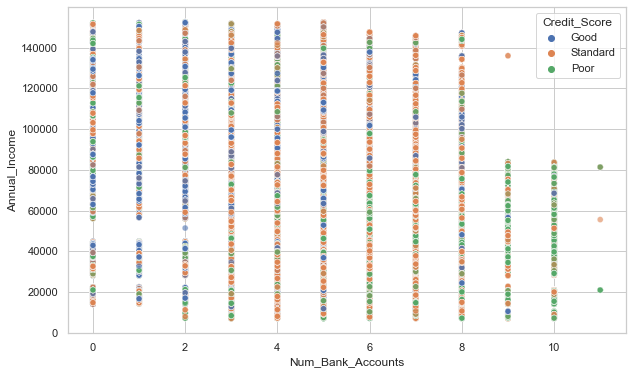

In [482]:
# Checking the scatterplot of Annual_Income and Num_Bank_Accounts after handling with outliers

sns.scatterplot(x= df.Num_Bank_Accounts, y=df.Annual_Income,  data=df, hue="Credit_Score", alpha=0.6);

### Num_Credit_Card

In [483]:
# Finding iqr lower and upper limit of Num_Credit_Card column

iqr_lower_upper("Num_Credit_Card")

lower limit : -0.5
upper limit: 11.5
the number of extreme values outside the lower and upper limits : 2230


In [484]:
# Checking the value counts of Num_Credit_Card column by grouping Customer_ID

df.groupby("Customer_ID")["Num_Credit_Card"].value_counts()

Customer_ID  Num_Credit_Card
1006         6                  8
1007         4                  7
             888                1
1008         3                  8
1009         3                  7
                               ..
50992        4                  7
             1213               1
50996        4                  7
             36                 1
50999        1                  8
Name: Num_Credit_Card, Length: 14821, dtype: int64

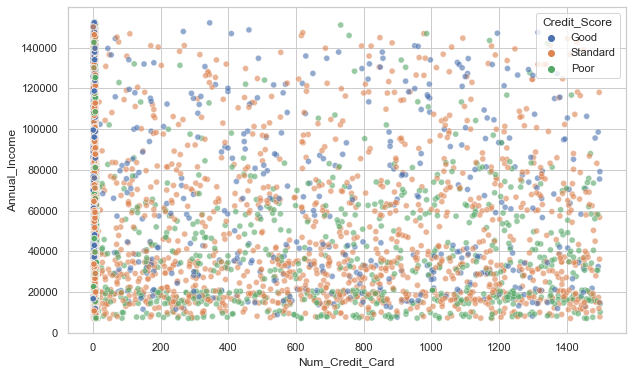

In [485]:
# Checking the scatterplot of Annual_Income and Num_Credit_Card to determine outliers

sns.scatterplot(x= df.Num_Credit_Card, y=df.Annual_Income,  data=df, hue="Credit_Score", alpha=0.6);

In [486]:
# checking the extreme values in Num_Credit_Card outside the lower and upper limits by sorting the Num_Credit_Card value

df[(df.Num_Credit_Card < lower)|(df.Num_Credit_Card > upper)][["Num_Credit_Card"]].value_counts(dropna=False).sort_index()

Num_Credit_Card
15                 3
16                 2
17                 1
18                 1
20                 1
                  ..
1495               1
1496               2
1497               3
1498               3
1499               2
Length: 1156, dtype: int64

In [487]:
# Checking the number of Num_Credit_Card whose Num_Credit_Card value less than 0

(df.Num_Credit_Card < 0).sum()

0

In [488]:
# Checking the number of Num_Credit_Card whose Num_Credit_Card value greater than upper limit

(df.Num_Credit_Card > upper).sum()

2230

In [489]:
# Checking the customer information whose Num_Credit_Card value greater than upper limit

df[df.Num_Credit_Card > upper]

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score
10,5648,8625,March,Rick Rothackerj,28,004-07-5839,Teacher,34847.84,3037.986667,2.0,1385,6.0,1,3,-1.0,5.42,2.0,Good,605.03,33.224951,321,No,18.816215,58.515976,466.466476,Standard
40,5694,38382,January,Np,31,612-70-8987,Lawyer,73928.46,5988.705000,4.0,1288,8.0,0,12,10.0,10.14,2.0,Good,548.20,39.962685,383,No,15015.000000,98.674410,740.196090,Good
157,5867,16640,June,Reema,32,068-83-4394,Entrepreneur,19300.34,1512.361667,6.0,1029,17.0,5,51,17.0,9.95,8.0,Bad,2430.21,25.847791,223,Yes,49.572062,83.447449,288.216656,Poor
163,5877,4911,April,Mark Felsenthald,41,561-60-9294,Musician,19514.88,1828.240000,7.0,488,17.0,0,30,12.0,4.17,2.0,Standard,881.40,34.503707,234,No,0.000000,45.388820,387.435180,Poor
207,5941,19779,August,Reijik,48,013-39-0742,Entrepreneur,20787.69,1999.307500,8.0,1381,14.0,3,22,14.0,8.13,3.0,Standard,614.60,35.344188,221,No,42.221993,21.745531,375.963226,Standard
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99611,155049,10281,April,Alistair Barre,31,172-85-1573,Journalist,64901.37,5298.447500,3.0,514,20.0,-100,14,15.0,2.94,0.0,Standard,442.06,29.639741,373,Yes,0.000000,162.171160,617.673590,Standard
99615,155053,10281,August,Alistair Barre,32,172-85-1573,Journalist,64901.37,5298.447500,3.0,232,20.0,0,19,18.0,2.94,3.0,Standard,442.06,29.145534,377,Yes,0.000000,126.263036,643.581714,Standard
99619,155061,44646,April,Jino,30,721-45-4479,Writer,142560.36,11773.030000,6.0,1430,13.0,1,23,15.0,11.22,0.0,Standard,220.75,34.671699,210,No,76.772094,982.946968,387.583938,Standard
99769,155287,49989,February,Jeb Blountf,23,176-40-0757,Architect,60015.32,5121.276667,7.0,679,14.0,978,8,8.0,10.47,310.0,Standard,1095.15,35.864367,183,Yes,187.008683,241.313632,353.805352,Standard


In [490]:
# Checking the Num_Credit_Card value for Customer_ID = 8625

df[df.Customer_ID == 8625][["Customer_ID","Num_Credit_Card"]]

,Customer_ID,Num_Credit_Card
8,8625,4
9,8625,4
10,8625,1385
11,8625,4
12,8625,4
13,8625,4
14,8625,4
15,8625,4


In [491]:
# Checking the Num_Credit_Card value for Customer_ID = 19779

df[df.Customer_ID == 19779][["Customer_ID","Num_Credit_Card"]]

,Customer_ID,Num_Credit_Card
200,19779,6
201,19779,6
202,19779,6
203,19779,6
204,19779,6
205,19779,6
206,19779,6
207,19779,1381


**According to the analysis above the extreme values in Annual_Income column outside the upper limit should be replaced with np.nan. Then null values can be filled with ffill and bfill method.**

In [492]:
# Replacing the extreme values in Num_Credit_Card column greater than upper limit with np.nan and then
# filling null values with ffill and bfill method by grouping Customer_ID.

df["Num_Credit_Card"] = df.Num_Credit_Card.replace([df[(df.Num_Credit_Card > upper)]["Num_Credit_Card"]], np.nan)
df["Num_Credit_Card"] = df.groupby("Customer_ID")["Num_Credit_Card"].fillna(method="ffill").fillna(method="bfill")

In [493]:
# Checking the null values after filling process

df["Num_Credit_Card"].isnull().sum()

0

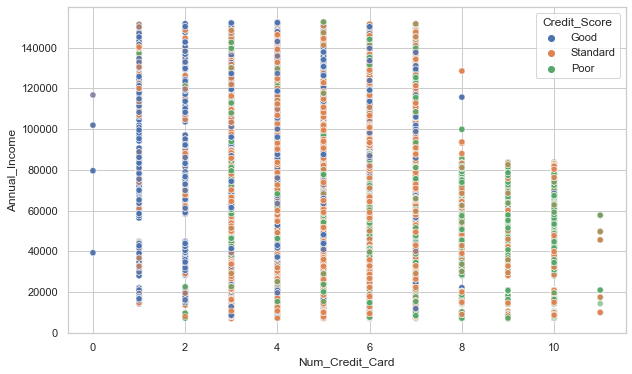

In [494]:
# Checking the scatterplot of Annual_Income and Num_Credit_Card after handling with outliers

sns.scatterplot(x= df.Num_Credit_Card, y=df.Annual_Income,  data=df, hue="Credit_Score", alpha=0.6);

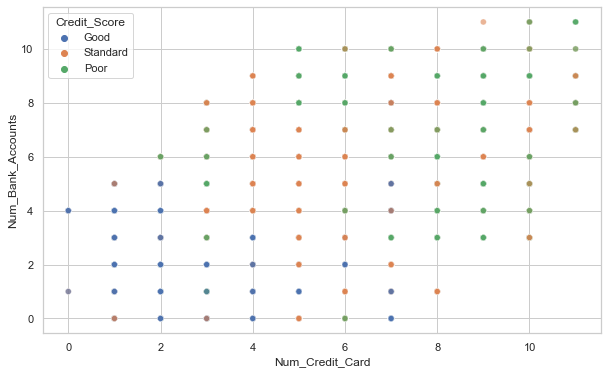

In [495]:
# Checking the scatterplot of Num_Bank_Accounts and Num_Credit_Card after handling with outliers

sns.scatterplot(x= df.Num_Credit_Card, y=df.Num_Bank_Accounts,  data=df, hue="Credit_Score", alpha=0.6);

### Interest_Rate column

In [496]:
# Finding iqr lower and upper limit of Interest_Rate column

iqr_lower_upper("Interest_Rate")

lower limit : -10.0
upper limit: 38.0
the number of extreme values outside the lower and upper limits : 2006


In [497]:
# Checking the value counts of Interest_Rate column by grouping Customer_ID

df.groupby("Customer_ID")["Interest_Rate"].value_counts()

Customer_ID  Interest_Rate
1006         22.0             8
1007         10.0             8
1008         17.0             8
1009         15.0             8
1011         5.0              8
                             ..
50984        26.0             8
50990        23.0             8
50992        10.0             8
50996        19.0             8
50999        4.0              8
Name: Interest_Rate, Length: 14292, dtype: int64

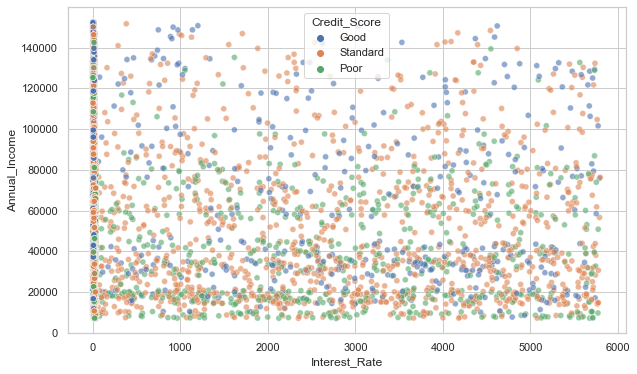

In [498]:
# Checking the scatterplot of Annual_Income and Interest_Rate to determine outliers

sns.scatterplot(x= df.Interest_Rate, y=df.Annual_Income,  data=df, hue="Credit_Score", alpha=0.6);

In [499]:
# checking the extreme values in Interest_Rate outside the lower and upper limits by sorting the Interest_Rate value

df[(df.Interest_Rate < lower)|(df.Interest_Rate > upper)][["Interest_Rate"]].value_counts(dropna=False).sort_index()

Interest_Rate
59.0             1
60.0             1
64.0             1
67.0             1
73.0             1
                ..
5775.0           1
5776.0           1
5788.0           1
5789.0           1
5797.0           1
Length: 1696, dtype: int64

In [500]:
# Checking the number of Interest_Rate whose Interest_Rate value less than 0

(df.Interest_Rate < 0).sum()

0

In [501]:
# Checking the number of Interest_Rate whose Interest_Rate value greater than upper limit

(df.Interest_Rate > upper).sum()

2006

In [502]:
# Checking the customer information whose Interest_Rate value greater than upper limit

df[df.Interest_Rate > upper]

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score
44,5698,38382,May,Np,31,612-70-8987,Lawyer,73928.46,5988.705000,4.0,5.0,5318.0,0,11,7.0,10.14,2.0,Good,548.20,26.333310,387,No,0.000000,177.951836,690.918664,Good
89,5767,49323,February,Soyoungd,33,342-90-2649,Engineer,88640.24,7266.686667,3.0,6.0,433.0,2,4,2.0,3.51,3.0,Good,950.36,41.036168,306,NM,135.173371,157.174788,674.320507,Good
167,5881,4911,August,Mark Felsenthald,41,561-60-9294,Musician,19514.88,1828.240000,7.0,5.0,5240.0,0,26,11.0,4.17,4.0,Standard,881.40,28.781888,238,No,0.000000,99.141541,343.682459,Poor
178,5900,44166,March,Nickb,20,028-16-4402,Entrepreneur,106733.13,8873.427500,4.0,4.0,4975.0,0,2,6.0,0.86,0.0,Good,76.23,42.070459,395,No,0.000000,172.032829,955.309921,Good
229,5975,49150,June,Dhanya Skariachano,40,311-13-7309,Architect,28572.39,2210.032500,6.0,3.0,668.0,3,25,11.0,4.89,2.0,Standard,400.07,35.693949,368,Yes,69.602920,129.264835,312.135495,Standard
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99791,155317,25333,August,Alexein,54,272-40-2510,Musician,99520.50,8479.375000,3.0,1.0,4396.0,3,8,5.0,4.08,5.0,Good,547.21,38.798114,200,NM,196.528591,147.563516,743.845393,Good
99801,155335,4658,February,Lawderr,16,441-26-1297,Developer,14937.49,1142.790833,8.0,8.0,387.0,-100,42,13.0,21.17,6.0,Bad,3699.44,35.964828,159,Yes,50.960878,149.887864,203.430341,Standard
99882,155456,18426,March,Yantoultra Nguif,31,291-51-7240,Mechanic,64511.34,5440.945000,7.0,3.0,1947.0,0,7,8.0,12.57,2.0,Standard,330.60,38.524095,276,Yes,0.000000,10000.000000,536.342920,Standard
99914,155504,5657,March,Phil Wahbao,54,683-59-7399,Media_Manager,20059.98,1523.665000,8.0,5.0,360.0,4,25,9.0,2.97,3.0,Good,909.01,29.204711,197,No,45.076827,111.567139,265.722534,Poor


In [503]:
# Checking the Interest_Rate value for Customer_ID = 38382

df[df.Customer_ID == 38382][["Customer_ID","Interest_Rate"]]

,Customer_ID,Interest_Rate
40,38382,8.0
41,38382,8.0
42,38382,8.0
43,38382,8.0
44,38382,5318.0
45,38382,8.0
46,38382,8.0
47,38382,8.0


In [504]:
# Checking the Interest_Rate value for Customer_ID = 4658

df[df.Customer_ID == 4658][["Customer_ID","Interest_Rate"]]

,Customer_ID,Interest_Rate
99800,4658,22.0
99801,4658,387.0
99802,4658,22.0
99803,4658,22.0
99804,4658,22.0
99805,4658,22.0
99806,4658,22.0
99807,4658,22.0


**According to the analysis above the extreme values in Interest_Rate column outside the upper limit should be replaced with np.nan. Then null values can be filled with ffill and bfill method.**

In [505]:
# Replacing the extreme values in Interest_Rate column greater than upper limit with np.nan and then
# filling null values with ffill and bfill method by grouping Customer_ID.

df["Interest_Rate"] = df.Interest_Rate.replace([df[(df.Interest_Rate > upper)]["Interest_Rate"]], np.nan)
df["Interest_Rate"] = df.groupby("Customer_ID")["Interest_Rate"].fillna(method="ffill").fillna(method="bfill")

In [506]:
# Checking the null values after filling process

df["Interest_Rate"].isnull().sum()

0

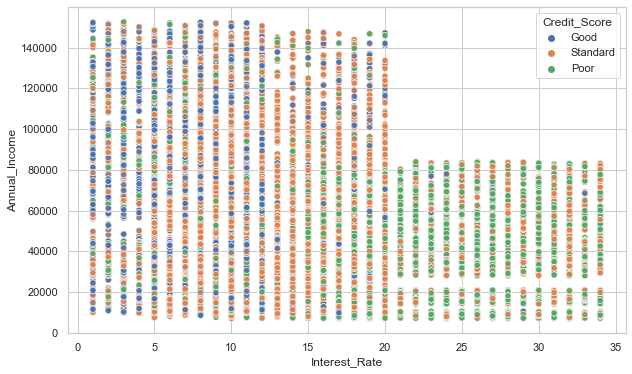

In [507]:
# Checking the scatterplot of Annual_Income and Interest_Rate after handling with outliers

sns.scatterplot(x= df.Interest_Rate, y=df.Annual_Income,  data=df, hue="Credit_Score", alpha=0.6);

### Num_of_Loan column

In [508]:
# Finding iqr lower and upper limit of Num_of_Loan column

iqr_lower_upper("Num_of_Loan")

lower limit : -5.0
upper limit: 11.0
the number of extreme values outside the lower and upper limits : 4284


In [509]:
# Checking the value counts of Num_of_Loan column by grouping Customer_ID

df.groupby("Customer_ID")["Num_of_Loan"].value_counts()

Customer_ID  Num_of_Loan
1006          2             8
1007          3             7
             -100           1
1008          0             8
1009          4             8
                           ..
50990         3             8
50992         6             8
50996         0             8
50999         1             7
             -100           1
Name: Num_of_Loan, Length: 16102, dtype: int64

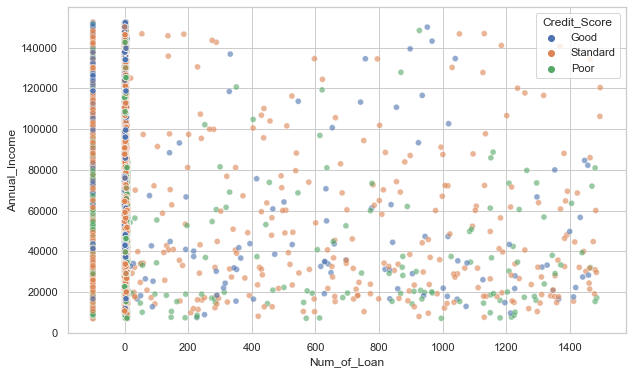

In [510]:
# Checking the scatterplot of Annual_Income and Num_of_Loan to determine outliers

sns.scatterplot(x= df.Num_of_Loan, y=df.Annual_Income,  data=df, hue="Credit_Score", alpha=0.6);

In [511]:
# checking the extreme values in Num_of_Loan outside the lower and upper limits by sorting the Num_of_Loan value

df[(df.Num_of_Loan < lower)|(df.Num_of_Loan > upper)][["Num_of_Loan"]].value_counts(dropna=False).sort_index()

Num_of_Loan
-100           3818
 17               1
 18               1
 19               1
 23               2
               ... 
 1482             1
 1484             1
 1485             1
 1495             1
 1496             1
Length: 400, dtype: int64

In [512]:
# Checking the number of Num_of_Loan whose Num_of_Loan value less than 0

(df.Num_of_Loan < 0).sum()

3818

In [513]:
# Checking the customer information whose Num_of_Loan value less than upper 0

df[df.Num_of_Loan < 0]

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score
31,5677,47249,August,Jasond,55,072-31-6145,Entrepreneur,30689.89,2612.490833,2.0,5.0,4.0,-100,4,9.0,1.99,4.0,Good,632.46,27.332515,214,No,16.415452,125.617251,379.216381,Standard
34,5684,7387,March,Deepaa,21,615-06-7821,Developer,35547.71,2853.309167,7.0,5.0,5.0,-100,5,12.0,2.58,4.0,Standard,943.86,23.462303,370,Yes,0.000000,173.138651,392.192266,Standard
39,5689,7387,August,Deepaa,21,615-06-7821,Developer,35547.71,2853.309167,7.0,5.0,5.0,-100,1,15.0,2.58,4.0,Standard,943.86,25.862922,375,Yes,0.000000,181.330901,364.000016,Standard
53,5711,10314,June,Nadiaq,34,411-51-0676,Lawyer,131313.40,10469.207759,0.0,1.0,8.0,-100,0,3.0,11.34,4.0,Good,352.16,41.980170,372,No,911.220179,86.566388,1140.067340,Standard
61,5723,21511,June,Annk,30,500-92-6408,Media_Manager,34081.38,2611.115000,8.0,7.0,15.0,-100,30,14.0,18.13,5.0,Standard,1704.18,31.170872,180,Yes,70.478333,108.950395,410.674366,Standard
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99877,155447,14421,June,Xolai,27,963-55-7106,Scientist,118677.54,9963.795000,4.0,4.0,6.0,-100,3,11.0,9.59,5.0,Good,995.47,38.556181,364,No,237.106366,231.276530,767.996604,Good
99901,155483,18822,June,Charles Abbotta,34,971-61-8388,Entrepreneur,41329.56,3421.130000,2.0,3.0,7.0,-100,2,10.0,10.66,2.0,Good,1245.01,32.846273,284,No,20.553577,272.792504,318.766919,Good
99902,155484,18822,July,Charles Abbotta,34,971-61-8388,Entrepreneur,41329.56,3421.130000,2.0,3.0,7.0,-100,2,8.0,12.66,2.0,Good,1245.01,39.011550,285,No,20.553577,462.117634,149.441790,Good
99969,155587,3862,February,Maria Sheahanb,45,868-70-2218,Media_Manager,16680.35,1528.029167,1.0,1.0,5.0,-100,3,0.0,5.69,4.0,Good,897.16,34.085971,254,No,41.113561,104.646237,267.043119,Good


In [514]:
# Checking the Num_of_Loan value for Customer_ID = 7387

df[df.Customer_ID == 7387][["Customer_ID","Num_of_Loan"]]

,Customer_ID,Num_of_Loan
32,7387,0
33,7387,0
34,7387,-100
35,7387,0
36,7387,0
37,7387,0
38,7387,0
39,7387,-100


In [515]:
# Checking the Num_of_Loan value for Customer_ID = 18822

df[df.Customer_ID == 18822][["Customer_ID","Num_of_Loan"]]

,Customer_ID,Num_of_Loan
99896,18822,1
99897,18822,1
99898,18822,1
99899,18822,1
99900,18822,1
99901,18822,-100
99902,18822,-100
99903,18822,1


In [516]:
# Checking the Num_of_Loan value for Customer_ID = 3862

df[df.Customer_ID == 3862][["Customer_ID","Num_of_Loan"]]

,Customer_ID,Num_of_Loan
99968,3862,4
99969,3862,-100
99970,3862,4
99971,3862,4
99972,3862,4
99973,3862,4
99974,3862,4
99975,3862,4


In [517]:
# Checking the number of Num_of_Loan whose Num_of_Loan value greater than upper limit

(df.Num_of_Loan > upper).sum()

466

In [518]:
# Checking the customer information whose Num_of_Loan value greater than upper limit

df[df.Num_of_Loan > upper]

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score
21,5663,11708,June,Langep,34,486-85-3974,Engineer,143162.640,12187.220000,1.0,5.0,8.0,967,8,6.0,7.10,3.0,Good,1303.01,39.783993,218,No,246.992319,257.808099,963.921581,Good
810,6848,25653,March,Alexei Oreskovicf,26,538-49-2118,Writer,134321.440,11064.453333,3.0,5.0,12.0,1464,26,21.0,4.09,3.0,Standard,1428.68,34.223492,394,Yes,253.688244,530.820570,949.502370,Standard
1390,7716,25806,July,Lopezu,21,066-73-7172,Lawyer,124419.660,10221.305000,3.0,4.0,11.0,622,9,10.0,7.12,1265.0,Good,923.85,27.446584,389,No,344.181536,288.564423,659.384541,Standard
2008,8646,16982,January,Bakerz,21,030-61-4163,Accountant,31069.320,2361.110000,2.0,3.0,12.0,352,14,3.0,7.78,2.0,Good,343.60,36.403191,227,No,34.168604,139.087148,342.855248,Good
2273,9043,3929,February,Huntt,21,008-37-9819,Doctor,38539.570,3438.630833,4.0,2.0,3.0,472,4,1.0,8.42,0.0,Good,526.62,30.039998,356,No,22.683279,285.282071,325.897733,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99760,155274,6919,January,Baldwinq,35,739-15-8297,Accountant,17818.600,1659.883333,4.0,6.0,14.0,661,30,12.0,10.91,3.0,Standard,301.52,26.264920,219,No,11.581102,203.733268,240.673964,Standard
99769,155287,49989,February,Jeb Blountf,23,176-40-0757,Architect,60015.320,5121.276667,7.0,4.0,14.0,978,8,8.0,10.47,310.0,Standard,1095.15,35.864367,183,Yes,187.008683,241.313632,353.805352,Standard
99845,155399,37966,June,Vlastelicax,23,815-15-2261,Architect,11834.645,688.220417,5.0,7.0,10.0,216,27,16.0,15.62,10.0,Standard,1095.90,33.072088,164,Yes,11.089575,45.455499,302.276968,Standard
99853,155411,12360,June,Rick Rothackeru,40,375-64-6913,Scientist,81093.160,7017.763333,10.0,7.0,17.0,349,29,20.0,15.72,12.0,Bad,4523.30,35.925627,118,NM,409.039442,314.580409,258.156482,Standard


In [519]:
# Checking the Num_of_Loan value for Customer_ID = 11708

df[df.Customer_ID == 11708][["Customer_ID","Num_of_Loan"]]

,Customer_ID,Num_of_Loan
16,11708,3
17,11708,3
18,11708,3
19,11708,3
20,11708,3
21,11708,967
22,11708,3
23,11708,3


In [520]:
# Checking the Num_of_Loan value for Customer_ID = 3929

df[df.Customer_ID == 3929][["Customer_ID","Num_of_Loan"]]

,Customer_ID,Num_of_Loan
2272,3929,1
2273,3929,472
2274,3929,-100
2275,3929,1
2276,3929,1
2277,3929,1
2278,3929,1
2279,3929,1


**According to the analysis above the extreme values in Num_of_Loan column outside the 0 and upper limit should be replaced with np.nan. Then null values can be filled with ffill and bfill method.**

In [521]:
# Replacing the extreme values in Num_of_Loan column less than 0 and greater than upper limit with np.nan and then
# filling null values with ffill and bfill method by grouping Customer_ID.

df["Num_of_Loan"] = df.Num_of_Loan.replace([df[(df.Num_of_Loan < 0) | (df.Num_of_Loan > upper)]["Num_of_Loan"]], np.nan)
df["Num_of_Loan"] = df.groupby("Customer_ID")["Num_of_Loan"].fillna(method="ffill").fillna(method="bfill")

In [522]:
# Checking the null values after filling process

df["Num_of_Loan"].isnull().sum()

0

In [523]:
(df.Num_of_Loan == -100).sum()

0

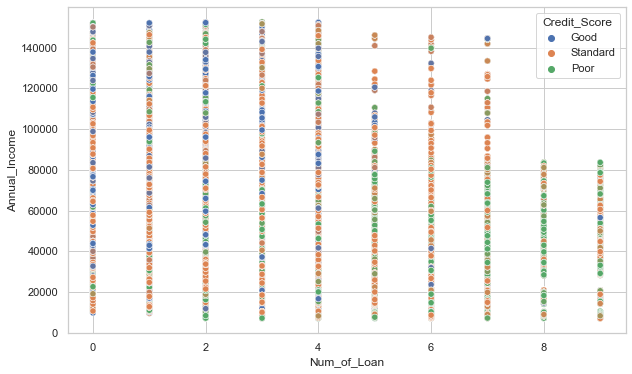

In [524]:
# Checking the scatterplot of Annual_Income and Num_of_Loan after handling with outliers

sns.scatterplot(x= df.Num_of_Loan, y=df.Annual_Income,  data=df, hue="Credit_Score", alpha=0.6);

### Num_of_Delayed_Payment column

In [525]:
# Finding iqr lower and upper limit of Num_of_Delayed_Payment column

iqr_lower_upper("Num_of_Delayed_Payment")

lower limit : -4.5
upper limit: 31.5
the number of extreme values outside the lower and upper limits : 720


In [526]:
# Checking the value counts of Num_of_Delayed_Payment column by grouping Customer_ID

df.groupby("Customer_ID")["Num_of_Delayed_Payment"].value_counts()

Customer_ID  Num_of_Delayed_Payment
1006         12.0                      5
             10.0                      1
             11.0                      1
             13.0                      1
1007         19.0                      6
                                      ..
50996        20.0                      1
50999        1.0                       5
             0.0                       1
             2.0                       1
             4.0                       1
Name: Num_of_Delayed_Payment, Length: 39051, dtype: int64

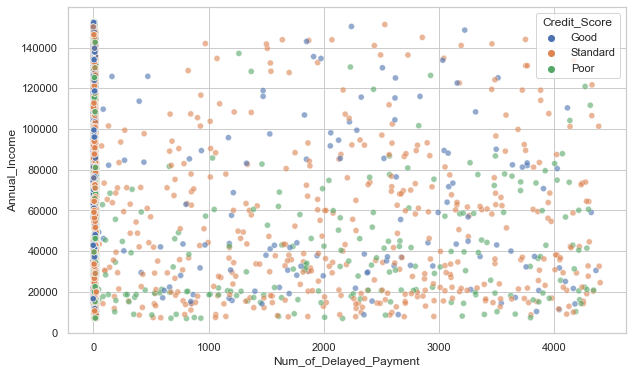

In [527]:
# Checking the scatterplot of Annual_Income and Num_of_Delayed_Payment to determine outliers

sns.scatterplot(x= df.Num_of_Delayed_Payment, y=df.Annual_Income,  data=df, hue="Credit_Score", alpha=0.6);

In [528]:
# checking the extreme values in Num_of_Delayed_Payment less than 0 and greater than upper limit by sorting the Num_of_Delayed_Payment value

df[(df.Num_of_Delayed_Payment < 0)|(df.Num_of_Delayed_Payment > upper)][["Num_of_Delayed_Payment"]].value_counts(dropna=False).sort_index()

Num_of_Delayed_Payment
-3.0                       89
-2.0                      223
-1.0                      299
 46.0                       1
 47.0                       1
                         ... 
 4340.0                     1
 4360.0                     1
 4384.0                     1
 4388.0                     1
 4397.0                     1
Length: 666, dtype: int64

In [529]:
# Checking the number of Num_of_Delayed_Payment whose Num_of_Delayed_Payment value less than 0

(df.Num_of_Delayed_Payment < 0).sum()

611

In [530]:
# Checking the customer information whose Num_of_Delayed_Payment value less than 0

df[df.Num_of_Delayed_Payment < 0]

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score
10,5648,8625,March,Rick Rothackerj,28,004-07-5839,Teacher,34847.840,3037.986667,2.0,4.0,6.0,1.0,3,-1.0,5.42,2.0,Good,605.03,33.224951,321,No,18.816215,58.515976,466.466476,Standard
698,6680,29152,March,Aruna Viswanathau,28,330-96-0638,Mechanic,15398.950,1548.245833,1.0,7.0,5.0,4.0,1,-1.0,8.41,3.0,Good,343.84,33.494442,341,NM,34.813970,47.607470,322.403143,Standard
1253,7511,12757,June,Mutikanit,49,325-07-8725,Doctor,15488.885,1273.740417,0.0,4.0,4.0,0.0,1,-3.0,1.38,4.0,Good,1287.59,30.801079,307,NM,0.000000,97.705452,319.668590,Standard
1561,7975,45940,February,enu,31,946-08-9738,Architect,30922.280,2494.856667,1.0,5.0,12.0,2.0,14,-2.0,11.71,2.0,Good,957.53,39.135924,256,No,30.338204,159.523585,329.623877,Poor
2167,8881,10251,August,orv,27,434-17-8443,Accountant,34841.870,3025.489167,1.0,7.0,1.0,2.0,1,-1.0,2.24,6.0,Good,142.05,38.351183,374,No,33.366098,174.874086,374.308732,Standard
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99269,154535,42604,June,Ernest Scheyderi,24,770-36-8261,Accountant,74349.180,6133.765000,0.0,3.0,2.0,2.0,11,-2.0,1.64,5.0,Good,929.91,26.522995,344,No,66.417096,252.992626,563.966777,Good
99512,154902,4345,January,Gilles Guillaumev,53,746-79-6875,Lawyer,150131.680,12596.973333,5.0,1.0,4.0,0.0,8,-2.0,11.49,0.0,Good,1138.36,30.013470,376,No,0.000000,949.847264,599.850069,Standard
99515,154905,4345,April,Gilles Guillaumev,54,746-79-6875,Lawyer,150131.680,12596.973333,5.0,1.0,4.0,0.0,8,-2.0,11.49,0.0,Good,1138.36,41.277741,379,No,0.000000,122.041469,1377.655865,Good
99586,155012,1348,March,Jon Herskovitzu,28,163-45-1172,Mechanic,17013.290,1326.774167,2.0,1.0,10.0,1.0,6,-2.0,16.93,2.0,Good,1452.79,27.513691,385,No,13.109663,100.828505,308.739248,Good


In [531]:
# Checking the Num_of_Delayed_Payment value for Customer_ID = 8625

df[df.Customer_ID == 8625][["Customer_ID","Num_of_Delayed_Payment"]]

,Customer_ID,Num_of_Delayed_Payment
8,8625,4.0
9,8625,1.0
10,8625,-1.0
11,8625,3.0
12,8625,1.0
13,8625,0.0
14,8625,4.0
15,8625,4.0


In [532]:
# Checking the Num_of_Delayed_Payment value for Customer_ID = 45940

df[df.Customer_ID == 45940][["Customer_ID","Num_of_Delayed_Payment"]]

,Customer_ID,Num_of_Delayed_Payment
1560,45940,1.0
1561,45940,-2.0
1562,45940,1.0
1563,45940,1.0
1564,45940,1.0
1565,45940,1.0
1566,45940,1.0
1567,45940,1.0


In [533]:
# Checking the Num_of_Delayed_Payment value for Customer_ID = 10251

df[df.Customer_ID == 10251][["Customer_ID","Num_of_Delayed_Payment"]]

,Customer_ID,Num_of_Delayed_Payment
2160,10251,2.0
2161,10251,2.0
2162,10251,1.0
2163,10251,2.0
2164,10251,2.0
2165,10251,2.0
2166,10251,4.0
2167,10251,-1.0


In [534]:
# Checking the number of Num_of_Delayed_Payment whose Num_of_Delayed_Payment value greater than upper limit

(df.Num_of_Delayed_Payment > upper).sum()

720

In [535]:
# Checking the customer information whose Num_of_Delayed_Payment value greater than upper limit

df[df.Num_of_Delayed_Payment > upper]

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score
252,6010,24648,May,Ayeshaz,43,425-47-6723,Musician,18627.640,1387.303333,7.0,7.0,19.0,6.0,31,3318.0,5.07,7.0,Bad,1793.54,25.585205,229,Yes,65.139488,24.346188,289.244657,Poor
284,6058,39828,May,Bri,36,734-54-7098,Manager,71681.400,5799.450000,3.0,6.0,15.0,1.0,8,3083.0,10.44,0.0,Standard,1293.02,40.791137,311,Yes,53.923514,10000.000000,358.095400,Good
304,6090,17068,January,Lawrencea,36,700-60-3660,Musician,15566.020,1423.168333,8.0,5.0,32.0,4.0,16,1338.0,9.24,7.0,Standard,1693.95,37.409934,94,Yes,43.070520,65.986586,323.259728,Poor
409,6247,47494,February,Simon Jessope,14,180-88-7800,Developer,39887.220,3224.935000,9.0,9.0,16.0,5.0,59,3104.0,11.25,10.0,Bad,3119.60,26.112222,150,Yes,133.470845,153.270725,295.751929,Poor
643,6597,30944,April,Tagarish,47,352-67-4436,Accountant,17787.340,1242.278333,8.0,4.0,16.0,2.0,6,183.0,5.65,0.0,Standard,730.90,34.903092,360,NM,20.063634,28.516044,325.648156,Standard
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99133,154331,47955,June,Mutikanix,31,671-00-6399,Lawyer,77633.040,6635.420000,7.0,5.0,34.0,5.0,55,3336.0,15.48,8.0,Bad,3392.65,32.025465,9,Yes,227.777065,106.015126,569.749810,Poor
99402,154736,31589,March,Sineadv,27,751-96-2010,Mechanic,8968.555,880.379583,10.0,8.0,30.0,8.0,58,3392.0,23.83,12.0,Bad,2502.86,38.044111,137,Yes,57.078833,93.647887,227.311238,Poor
99562,154976,1616,March,Raymondn,28,487-65-9318,Lawyer,21471.580,1879.298333,7.0,3.0,16.0,2.0,14,3688.0,2.00,4.0,Standard,68.06,40.940335,285,No,23.498319,33.192490,391.239024,Standard
99563,154977,1616,April,Raymondn,28,487-65-9318,Lawyer,21471.580,1879.298333,7.0,3.0,16.0,2.0,15,221.0,11.00,4.0,Standard,68.06,31.039063,286,No,23.498319,12.340388,392.091127,Standard


In [536]:
# Checking the Num_of_Delayed_Payment value for Customer_ID = 24648

df[df.Customer_ID == 24648][["Customer_ID","Num_of_Delayed_Payment"]]

,Customer_ID,Num_of_Delayed_Payment
248,24648,21.0
249,24648,21.0
250,24648,21.0
251,24648,22.0
252,24648,3318.0
253,24648,21.0
254,24648,21.0
255,24648,18.0


In [537]:
# Checking the Num_of_Delayed_Payment value for Customer_ID = 47494

df[df.Customer_ID == 47494][["Customer_ID","Num_of_Delayed_Payment"]]

,Customer_ID,Num_of_Delayed_Payment
408,47494,21.0
409,47494,3104.0
410,47494,19.0
411,47494,19.0
412,47494,19.0
413,47494,18.0
414,47494,19.0
415,47494,22.0


**According to the analysis above the extreme values in Num_of_Delayed_Payment column less than 0 and greater than upper limit should be replaced with np.nan. Then null values can be filled with mode value for each Customer by grouping Customer_ID.**

In [538]:
# Replacing the extreme values in Num_of_Delayed_Payment column less than 0 and greater than upper limit with np.nan and then
# filling null values with ffill and bfill method by grouping Customer_ID.

df["Num_of_Delayed_Payment"] = df.Num_of_Delayed_Payment.replace([df[(df.Num_of_Delayed_Payment < 0) | (df.Num_of_Delayed_Payment > upper)]["Num_of_Delayed_Payment"]], np.nan)
df["Num_of_Delayed_Payment"] = df.groupby("Customer_ID")["Num_of_Delayed_Payment"].apply(lambda x : x.fillna(x.mode()[0]))

In [539]:
# Checking the null values after filling process

df["Num_of_Delayed_Payment"].isnull().sum()

0

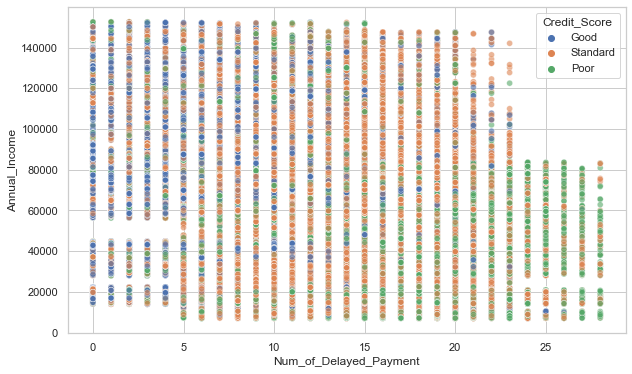

In [540]:
# Checking the scatterplot of Annual_Income and Num_of_Delayed_Payment after handling with outliers

sns.scatterplot(x= df.Num_of_Delayed_Payment, y=df.Annual_Income,  data=df, hue="Credit_Score", alpha=0.6);

### Num_Credit_Inquiries column

In [541]:
# Finding iqr lower and upper limit of Num_Credit_Inquiries column

iqr_lower_upper("Num_Credit_Inquiries")

lower limit : -6.0
upper limit: 18.0
the number of extreme values outside the lower and upper limits : 1652


In [542]:
# Checking the value counts of Num_Credit_Inquiries column by grouping Customer_ID

df.groupby("Customer_ID")["Num_Credit_Inquiries"].value_counts()

Customer_ID  Num_Credit_Inquiries
1006         8.0                     8
1007         1.0                     7
             1196.0                  1
1008         10.0                    7
             6.0                     1
                                    ..
50992        5.0                     8
50996        6.0                     7
             737.0                   1
50999        4.0                     5
             7.0                     3
Name: Num_Credit_Inquiries, Length: 20860, dtype: int64

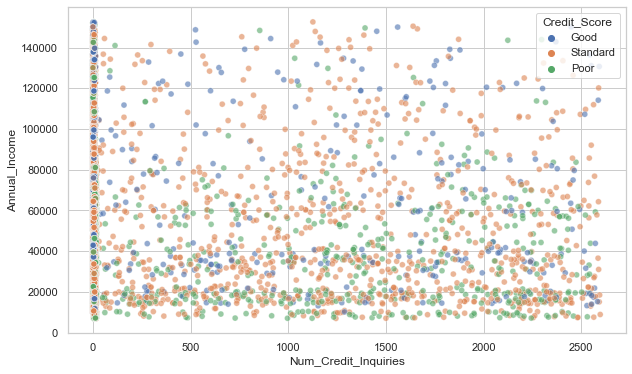

In [543]:
# Checking the scatterplot of Annual_Income and Num_Credit_Inquiries to determine outliers

sns.scatterplot(x= df.Num_Credit_Inquiries, y=df.Annual_Income,  data=df, hue="Credit_Score", alpha=0.6);

In [544]:
# Checking the extreme values in Num_Credit_Inquiries less than 0 and greater than upper limit by sorting the Num_Credit_Inquiries value

df[(df.Num_Credit_Inquiries < 0)|(df.Num_Credit_Inquiries > upper)][["Num_Credit_Inquiries"]].value_counts(dropna=False).sort_index()

Num_Credit_Inquiries
26.0                    1
29.0                    1
31.0                    4
32.0                    2
33.0                    1
                       ..
2588.0                  1
2589.0                  2
2592.0                  2
2594.0                  1
2597.0                  1
Length: 1195, dtype: int64

In [545]:
# Checking the number of Num_Credit_Inquiries whose Num_Credit_Inquiries value less than 0

(df.Num_Credit_Inquiries < 0).sum()

0

In [546]:
# Checking the number of Num_Credit_Inquiries whose Num_Credit_Inquiries value greater than upper limit

(df.Num_Credit_Inquiries > upper).sum()

1652

In [547]:
# Checking the customer information whose Num_Credit_Inquiries value greater than upper limit

df[df.Num_Credit_Inquiries > upper]

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score
173,5891,41326,June,Lee Chyenz,42,905-50-7912,Media_Manager,10183.015,1074.584583,7.0,5.0,17.0,5.0,48,24.0,10.97,1050.0,Bad,1672.43,25.105403,126,Yes,37.588073,73.899861,285.970524,Poor
193,5923,42489,February,Rickt,34,189-09-5267,Mechanic,57983.120,4720.926667,9.0,8.0,31.0,8.0,53,21.0,7.27,1044.0,Bad,3532.83,37.873642,147,Yes,200.432613,193.873375,327.786678,Standard
198,5928,42489,July,Rickt,34,189-09-5267,Mechanic,57983.120,4720.926667,9.0,8.0,31.0,8.0,49,21.0,7.27,1936.0,Bad,3532.83,24.631497,152,Yes,200.432613,234.732040,316.928013,Standard
199,5929,42489,August,Rickt,34,189-09-5267,Mechanic,57983.120,4720.926667,9.0,8.0,31.0,8.0,48,24.0,7.27,1936.0,Bad,3532.83,24.726351,153,Yes,200.432613,159.136722,362.523331,Poor
234,5984,46721,March,Sarahb,37,904-88-7361,Manager,39641.540,3007.461667,10.0,8.0,25.0,6.0,61,15.0,1.54,568.0,Bad,2258.73,27.572863,106,Yes,172.382527,198.042123,190.321516,Poor
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99768,155286,49989,January,Jeb Blountf,23,176-40-0757,Architect,60015.320,5121.276667,7.0,4.0,14.0,7.0,8,8.0,17.47,310.0,Standard,1095.15,29.272858,182,Yes,13580.000000,136.685509,438.433474,Standard
99769,155287,49989,February,Jeb Blountf,23,176-40-0757,Architect,60015.320,5121.276667,7.0,4.0,14.0,7.0,8,8.0,10.47,310.0,Standard,1095.15,35.864367,183,Yes,187.008683,241.313632,353.805352,Standard
99789,155315,25333,June,Alexein,54,272-40-2510,Musician,99520.500,8479.375000,3.0,1.0,5.0,3.0,8,8.0,4.08,93.0,Good,547.21,32.224773,198,No,196.528591,162.714630,704.731960,Good
99800,155334,4658,January,Lawderr,16,441-26-1297,Developer,14937.490,1142.790833,8.0,8.0,22.0,7.0,44,12.0,21.17,2209.0,Bad,3699.44,23.574545,158,Yes,50.960878,97.586933,255.731272,Standard


In [548]:
# Checking the Num_Credit_Inquiries value for Customer_ID = 41326

df[df.Customer_ID == 41326][["Customer_ID","Num_Credit_Inquiries"]]

,Customer_ID,Num_Credit_Inquiries
168,41326,6.0
169,41326,6.0
170,41326,6.0
171,41326,6.0
172,41326,6.0
173,41326,1050.0
174,41326,6.0
175,41326,6.0


In [549]:
# Checking the Num_Credit_Inquiries value for Customer_ID = 4658

df[df.Customer_ID == 4658][["Customer_ID","Num_Credit_Inquiries"]]

,Customer_ID,Num_Credit_Inquiries
99800,4658,2209.0
99801,4658,6.0
99802,4658,6.0
99803,4658,6.0
99804,4658,6.0
99805,4658,9.0
99806,4658,9.0
99807,4658,9.0


In [550]:
# Checking the Num_Credit_Inquiries value for Customer_ID = 14421

df[df.Customer_ID == 14421][["Customer_ID","Num_Credit_Inquiries"]]

,Customer_ID,Num_Credit_Inquiries
99872,14421,74.0
99873,14421,1.0
99874,14421,1.0
99875,14421,5.0
99876,14421,5.0
99877,14421,5.0
99878,14421,5.0
99879,14421,5.0


**According to the analysis above the extreme values in Num_Credit_Inquiries column greater than upper limit should be replaced with np.nan. Then null values can be filled with ffill and bfill method.**

In [551]:
# Replacing the extreme values in Num_of_Loan column less than 0 and greater than upper limit with np.nan and then
# filling null values with ffill and bfill method by grouping Customer_ID.

df["Num_Credit_Inquiries"] = df.Num_Credit_Inquiries.replace([df[(df.Num_Credit_Inquiries > upper)]["Num_Credit_Inquiries"]], np.nan)
df["Num_Credit_Inquiries"] = df.groupby("Customer_ID")["Num_Credit_Inquiries"].fillna(method="ffill").fillna(method="bfill")

In [552]:
# Checking the null values after filling process

(df.Num_Credit_Inquiries.isnull()).sum()

0

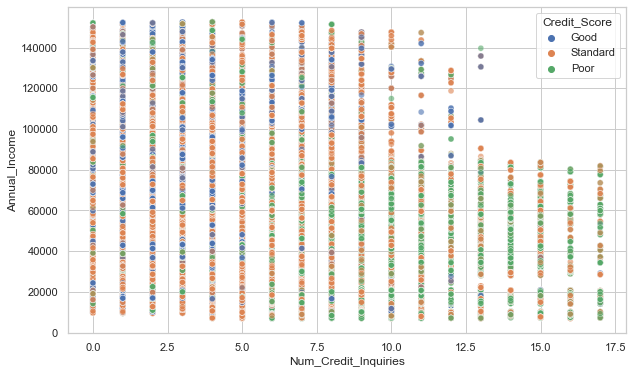

In [553]:
# Checking the scatterplot of Annual_Income and Num_Credit_Inquiries after handling with outliers

sns.scatterplot(x= df.Num_Credit_Inquiries, y=df.Annual_Income,  data=df, hue="Credit_Score", alpha=0.6);

### Total_EMI_per_month column

In [554]:
# Finding iqr lower and upper limit of Total_EMI_per_month column

iqr_lower_upper("Total_EMI_per_month")

lower limit : -166.07
upper limit: 357.6
the number of extreme values outside the lower and upper limits : 6386


In [555]:
# Checking the value counts of Total_EMI_per_month column by grouping Customer_ID

df.groupby("Customer_ID")["Total_EMI_per_month"].value_counts()

Customer_ID  Total_EMI_per_month
1006         27.442089              7
             32972.000000           1
1007         45.745700              8
1008         0.000000               8
1009         188.456595             8
                                   ..
50990        23168.000000           1
50992        25.467999              7
             5964.000000            1
50996        0.000000               8
50999        48.577978              8
Name: Total_EMI_per_month, Length: 16161, dtype: int64

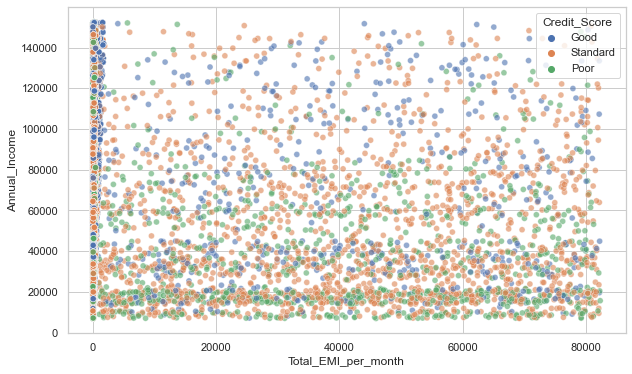

In [556]:
# Checking the scatterplot of Annual_Income and Total_EMI_per_month to determine outliers

sns.scatterplot(x= df.Total_EMI_per_month, y=df.Annual_Income,  data=df, hue="Credit_Score", alpha=0.6);

In [557]:
# Checking the extreme values in Total_EMI_per_month less than 0 and greater than upper limit by sorting the Total_EMI_per_month value

df[(df.Total_EMI_per_month < 0)|(df.Total_EMI_per_month > upper)][["Total_EMI_per_month"]].value_counts(dropna=False).sort_index()

Total_EMI_per_month
358.040565             8
358.996715             7
359.263237             8
359.295940             8
359.907681             8
                      ..
82193.000000           1
82204.000000           1
82236.000000           1
82256.000000           1
82331.000000           1
Length: 3653, dtype: int64

In [558]:
# Checking the number of Total_EMI_per_month whose Total_EMI_per_month value less than 0

(df.Total_EMI_per_month < 0).sum()

0

In [559]:
# Checking the number of Total_EMI_per_month whose Total_EMI_per_month value greater than upper limit

(df.Total_EMI_per_month > upper).sum()

6386

In [560]:
# Checking the customer information whose Total_EMI_per_month value greater than upper limit

df[df.Total_EMI_per_month > upper]

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score
40,5694,38382,January,Np,31,612-70-8987,Lawyer,73928.46,5988.705000,4.0,5.0,8.0,0.0,12,10.0,10.14,2.0,Good,548.20,39.962685,383,No,15015.000000,98.674410,740.196090,Good
45,5699,38382,June,Np,31,612-70-8987,Lawyer,73928.46,5988.705000,4.0,5.0,8.0,0.0,7,7.0,10.14,2.0,Good,548.20,35.275437,388,No,15515.000000,235.790325,633.080175,Good
50,5708,10314,March,Nadiaq,34,411-51-0676,Lawyer,131313.40,10469.207759,0.0,1.0,8.0,2.0,0,3.0,9.34,4.0,Good,352.16,31.803134,369,NM,911.220179,188.064321,1038.569407,Good
51,5709,10314,April,Nadiaq,34,411-51-0676,Lawyer,131313.40,10469.207759,0.0,1.0,8.0,2.0,0,2.0,8.34,4.0,Good,352.16,42.645785,370,No,23834.000000,337.434956,899.198772,Good
52,5710,10314,May,Nadiaq,34,411-51-0676,Lawyer,131313.40,10469.207759,0.0,1.0,8.0,2.0,0,4.0,9.34,4.0,Good,352.16,40.902517,371,No,32662.000000,263.378909,963.254819,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99959,155569,8324,August,Ryanl,21,253-72-7758,Architect,38321.39,3106.647859,4.0,4.0,3.0,4.0,6,7.0,1.59,6.0,Good,678.57,28.951691,210,No,362.072453,259.135635,242.038135,Standard
99960,155574,14124,January,Lucia Mutikanik,18,340-85-7301,Lawyer,42903.79,3468.315833,0.0,4.0,6.0,1.0,14,0.0,4.10,1.0,Good,1079.48,27.289440,337,No,50894.000000,78.514945,493.341182,Good
99970,155588,3862,March,Maria Sheahanb,45,868-70-2218,Media_Manager,16680.35,1528.029167,1.0,1.0,5.0,4.0,1,0.0,5.69,8.0,Good,897.16,30.472041,255,No,75011.000000,75.504972,316.184384,Good
99985,155611,34304,February,Sarah McBridec,28,031-35-0942,Architect,20002.88,1929.906667,10.0,8.0,29.0,5.0,33,25.0,23.31,9.0,Bad,3571.70,39.772607,69,Yes,12112.000000,148.275233,273.750662,Poor


In [561]:
# Checking the Total_EMI_per_month value for Customer_ID = 38382

df[df.Customer_ID == 38382][["Customer_ID","Total_EMI_per_month"]]

,Customer_ID,Total_EMI_per_month
40,38382,15015.0
41,38382,0.0
42,38382,0.0
43,38382,0.0
44,38382,0.0
45,38382,15515.0
46,38382,0.0
47,38382,0.0


In [562]:
# Checking the Total_EMI_per_month value for Customer_ID = 10314

df[df.Customer_ID == 10314][["Customer_ID","Total_EMI_per_month"]]

,Customer_ID,Total_EMI_per_month
48,10314,137.644605
49,10314,137.644605
50,10314,911.220179
51,10314,23834.000000
52,10314,32662.000000
53,10314,911.220179
54,10314,911.220179
55,10314,911.220179


In [563]:
# Checking the Total_EMI_per_month value for Customer_ID = 8324

df[df.Customer_ID == 8324][["Customer_ID","Total_EMI_per_month"]]

,Customer_ID,Total_EMI_per_month
99952,8324,114.271146
99953,8324,114.271146
99954,8324,114.271146
99955,8324,362.072453
99956,8324,362.072453
99957,8324,362.072453
99958,8324,362.072453
99959,8324,362.072453


**According to the analysis above, it was concluded that the upper limit for Total_EMI_per_month should be greater.**

#### Updating upper limit for Total_EMI_per_month column

In [564]:
# Checking the value counts of Total_EMI_per_month whose value greater than upper limit

df[df.Total_EMI_per_month > upper]["Total_EMI_per_month"].value_counts().sort_index().head(1000)

358.040565      8
358.996715      7
359.263237      8
359.295940      8
359.907681      8
               ..
11393.000000    1
11410.000000    1
11419.000000    1
11433.000000    1
11446.000000    1
Name: Total_EMI_per_month, Length: 1000, dtype: int64

In [565]:
# Checking the values of Total_EMI_per_month column whose values greater than Monthly_Inhand_Salary

df[df["Monthly_Inhand_Salary"] < df["Total_EMI_per_month"]][["Customer_ID", "Monthly_Inhand_Salary", "Total_EMI_per_month"]]

,Customer_ID,Monthly_Inhand_Salary,Total_EMI_per_month
40,38382,5988.705000,15015.0
45,38382,5988.705000,15515.0
51,10314,10469.207759,23834.0
52,10314,10469.207759,32662.0
76,47624,2825.233333,16415.0
...,...,...,...
99921,9812,11777.746667,20563.0
99960,14124,3468.315833,50894.0
99970,3862,1528.029167,75011.0
99985,34304,1929.906667,12112.0


In [566]:
# Checking the value counts of Total_EMI_per_month column whose values greater than Monthly_Inhand_Salary by sorting index

df[df["Monthly_Inhand_Salary"] < df["Total_EMI_per_month"]][["Total_EMI_per_month"]].value_counts(dropna=False).sort_index()

Total_EMI_per_month
1037.0                 1
1325.0                 1
1436.0                 1
1614.0                 1
1627.0                 1
                      ..
82193.0                1
82204.0                1
82236.0                1
82256.0                1
82331.0                1
Length: 2940, dtype: int64

In [567]:
# As it is seen from the results above we can update upper limit as 1036

# Checking the number of Total_EMI_per_month values greater than 1036
(df.Total_EMI_per_month > 1036).sum()

3317

In [568]:
# Checking the customer information whose Total_EMI_per_month values greater than 1036

df[df.Total_EMI_per_month > 1036]

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score
40,5694,38382,January,Np,31,612-70-8987,Lawyer,73928.46,5988.705000,4.0,5.0,8.0,0.0,12,10.0,10.14,2.0,Good,548.20,39.962685,383,No,15015.0,98.674410,740.196090,Good
45,5699,38382,June,Np,31,612-70-8987,Lawyer,73928.46,5988.705000,4.0,5.0,8.0,0.0,7,7.0,10.14,2.0,Good,548.20,35.275437,388,No,15515.0,235.790325,633.080175,Good
51,5709,10314,April,Nadiaq,34,411-51-0676,Lawyer,131313.40,10469.207759,0.0,1.0,8.0,2.0,0,2.0,8.34,4.0,Good,352.16,42.645785,370,No,23834.0,337.434956,899.198772,Good
52,5710,10314,May,Nadiaq,34,411-51-0676,Lawyer,131313.40,10469.207759,0.0,1.0,8.0,2.0,0,4.0,9.34,4.0,Good,352.16,40.902517,371,No,32662.0,263.378909,963.254819,Good
76,5746,47624,May,Jamesj,44,366-68-1681,Journalist,31370.80,2825.233333,1.0,6.0,12.0,2.0,1,0.0,5.76,5.0,Good,421.43,25.189232,321,No,16415.0,184.700572,341.206633,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99921,155515,9812,February,enj,38,647-67-8889,Media_Manager,139664.96,11777.746667,3.0,6.0,12.0,4.0,14,12.0,12.39,8.0,Standard,365.66,40.171095,356,Yes,20563.0,421.318866,582.724785,Standard
99960,155574,14124,January,Lucia Mutikanik,18,340-85-7301,Lawyer,42903.79,3468.315833,0.0,4.0,6.0,1.0,14,0.0,4.10,1.0,Good,1079.48,27.289440,337,No,50894.0,78.514945,493.341182,Good
99970,155588,3862,March,Maria Sheahanb,45,868-70-2218,Media_Manager,16680.35,1528.029167,1.0,1.0,5.0,4.0,1,0.0,5.69,8.0,Good,897.16,30.472041,255,No,75011.0,75.504972,316.184384,Good
99985,155611,34304,February,Sarah McBridec,28,031-35-0942,Architect,20002.88,1929.906667,10.0,8.0,29.0,5.0,33,25.0,23.31,9.0,Bad,3571.70,39.772607,69,Yes,12112.0,148.275233,273.750662,Poor


In [569]:
# Checking the Total_EMI_per_month value for Customer_ID = 38382

df[df.Customer_ID == 38382][["Customer_ID","Total_EMI_per_month"]]

,Customer_ID,Total_EMI_per_month
40,38382,15015.0
41,38382,0.0
42,38382,0.0
43,38382,0.0
44,38382,0.0
45,38382,15515.0
46,38382,0.0
47,38382,0.0


In [570]:
# Checking the Total_EMI_per_month value for Customer_ID = 14124

df[df.Customer_ID == 14124][["Customer_ID","Total_EMI_per_month"]]

,Customer_ID,Total_EMI_per_month
99960,14124,50894.000000
99961,14124,34.975457
99962,14124,34.975457
99963,14124,34.975457
99964,14124,34.975457
99965,14124,34.975457
99966,14124,34.975457
99967,14124,34.975457


In [571]:
# Checking the Total_EMI_per_month value for Customer_ID = 37932

df[df.Customer_ID == 37932][["Customer_ID","Total_EMI_per_month"]]

,Customer_ID,Total_EMI_per_month
99992,37932,35.104023
99993,37932,58638.000000
99994,37932,35.104023
99995,37932,35.104023
99996,37932,35.104023
99997,37932,35.104023
99998,37932,35.104023
99999,37932,35.104023


**According to the analysis above the extreme values in Total_EMI_per_month column greater than 1036 should be replaced with np.nan. Then null values can be filled with mode or ffill, bfill methods by grouping Customer_ID.**

In [572]:
# Replacing the extreme values in Total_EMI_per_month column greater than 1036 with np.nan and then
# filling null values with ffill and bfill method by grouping Customer_ID.

df["Total_EMI_per_month"] = df.Total_EMI_per_month.replace([df[(df.Total_EMI_per_month > upper)]["Total_EMI_per_month"]], np.nan)
df["Total_EMI_per_month"] = df.groupby("Customer_ID")["Total_EMI_per_month"].fillna(method="ffill").fillna(method="bfill")

In [573]:
# Checking the null values after filling process

(df.Total_EMI_per_month.isnull()).sum()

0

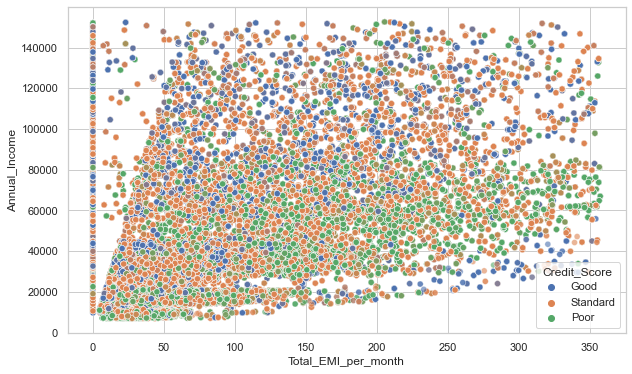

In [574]:
# Checking the scatterplot of Annual_Income and Total_EMI_per_month after handling with outliers

sns.scatterplot(x= df.Total_EMI_per_month, y=df.Annual_Income,  data=df, hue="Credit_Score", alpha=0.6);

### Amount_invested_monthly column

In [575]:
# Finding iqr lower and upper limit of Amount_invested_monthly column

iqr_lower_upper("Amount_invested_monthly")

lower limit : -206.46
upper limit: 545.04
the number of extreme values outside the lower and upper limits : 9646


In [576]:
# Checking the value counts of Amount_invested_monthly column by grouping Customer_ID

df.groupby("Customer_ID")["Amount_invested_monthly"].value_counts()

Customer_ID  Amount_invested_monthly
1006         45.301068                  1
             51.726244                  1
             56.494982                  1
             60.828288                  1
             61.732715                  1
                                       ..
50999        139.176062                 1
             164.378342                 1
             409.776140                 1
             479.772459                 1
             692.178202                 1
Name: Amount_invested_monthly, Length: 93818, dtype: int64

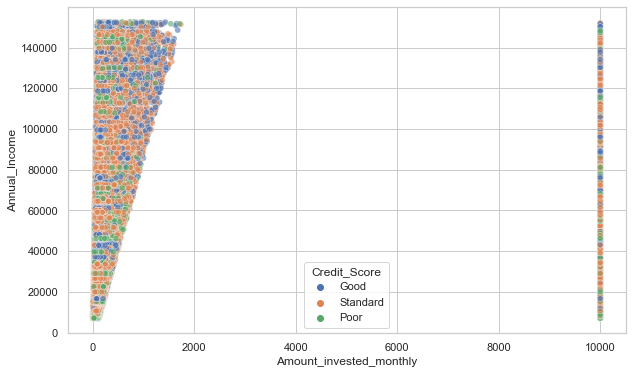

In [577]:
# Checking the scatterplot of Annual_Income and Amount_invested_monthly to determine outliers

sns.scatterplot(x= df.Amount_invested_monthly, y=df.Annual_Income,  data=df, hue="Credit_Score", alpha=0.6);

In [578]:
# Checking the extreme values in Amount_invested_monthly less than 0 and greater than upper limit by sorting the Amount_invested_monthly value

df[(df.Amount_invested_monthly < 0)|(df.Amount_invested_monthly > upper)][["Amount_invested_monthly"]].value_counts(dropna=False).sort_index()

Amount_invested_monthly
545.067054                    1
545.153034                    1
545.166329                    1
545.259584                    1
545.324976                    1
                           ... 
1648.115331                   1
1670.858260                   1
1709.767571                   1
1733.700474                   1
10000.000000               4237
Length: 5305, dtype: int64

In [579]:
# Checking the number of Amount_invested_monthly whose Amount_invested_monthly value less than 0

(df.Amount_invested_monthly < 0).sum()

0

In [580]:
# Checking the number of Amount_invested_monthly whose Amount_invested_monthly value greater than upper limit

(df.Amount_invested_monthly > upper).sum()

9646

In [581]:
# Checking the customer information whose Amount_invested_monthly value greater than upper limit

df[df.Amount_invested_monthly > upper]

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score
18,5660,11708,March,Langep,34,486-85-3974,Engineer,143162.64,12187.220000,1.0,5.0,8.0,3.0,8,7.0,11.10,3.0,Good,1303.01,26.519815,215,No,246.992319,10000.000000,715.741367,Good
19,5661,11708,April,Langep,34,486-85-3974,Engineer,143162.64,12187.220000,1.0,5.0,8.0,3.0,8,5.0,9.10,3.0,Good,1303.01,39.501648,216,No,246.992319,825.216270,426.513411,Good
23,5665,11708,August,Langep,34,486-85-3974,Engineer,143162.64,12187.220000,1.0,5.0,8.0,3.0,8,6.0,7.10,3.0,Good,1303.01,38.374753,220,No,246.992319,10000.000000,895.494583,Standard
28,5674,47249,May,Jasond,55,072-31-6145,Entrepreneur,30689.89,2612.490833,2.0,5.0,4.0,1.0,5,6.0,-1.01,4.0,Good,632.46,41.154317,211,No,16.415452,10000.000000,359.374916,Standard
43,5697,38382,April,Np,31,612-70-8987,Lawyer,73928.46,5988.705000,4.0,5.0,8.0,0.0,8,7.0,10.14,2.0,Good,548.20,30.201658,386,No,0.000000,618.202391,270.668109,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99923,155517,9812,April,enj,38,647-67-8889,Media_Manager,139664.96,11777.746667,3.0,6.0,12.0,4.0,14,9.0,12.39,8.0,Standard,365.66,36.412347,358,Yes,28.182033,714.470516,319.573135,Standard
99927,155521,9812,August,enj,38,647-67-8889,Media_Manager,139664.96,11777.746667,3.0,6.0,12.0,4.0,14,12.0,12.39,9.0,Standard,365.66,29.735401,362,Yes,28.182033,1104.416249,635.754174,Good
99944,155550,20915,January,Ryana,33,837-85-9800,Media_Manager,59146.36,4908.863333,2.0,5.0,6.0,1.0,8,6.0,6.68,2.0,Good,418.03,34.720661,241,No,26.778419,606.436542,147.671372,Standard
99951,155557,20915,August,Ryana,33,837-85-9800,Media_Manager,59146.36,4908.863333,3.0,6.0,6.0,1.0,8,6.0,6.68,5.0,Good,418.03,27.682186,248,No,26.778419,10000.000000,389.488483,Standard


In [582]:
# Checking the Amount_invested_monthly value for Customer_ID = 11708

df[df.Customer_ID == 11708][["Customer_ID","Amount_invested_monthly"]]

,Customer_ID,Amount_invested_monthly
16,11708,168.413703
17,11708,232.860384
18,11708,10000.000000
19,11708,825.216270
20,11708,430.947528
21,11708,257.808099
22,11708,263.174163
23,11708,10000.000000


In [583]:
# Checking the Amount_invested_monthly value for Customer_ID = 20915

df[df.Customer_ID == 20915][["Customer_ID","Amount_invested_monthly"]]

,Customer_ID,Amount_invested_monthly
99944,20915,606.436542
99945,20915,77.794586
99946,20915,188.544697
99947,20915,183.584149
99948,20915,463.834256
99949,20915,91.321664
99950,20915,502.376320
99951,20915,10000.000000


In [584]:
# Checking the Amount_invested_monthly value for Customer_ID = 9812

df[df.Customer_ID == 9812][["Customer_ID","Amount_invested_monthly"]] 

,Customer_ID,Amount_invested_monthly
99920,9812,282.782346
99921,9812,421.318866
99922,9812,124.134750
99923,9812,714.470516
99924,9812,314.407561
99925,9812,378.289477
99926,9812,378.289477
99927,9812,1104.416249


In [585]:
# Finding the max Amount_invested_monthly value for those whose Amount_invested_monthly value is less than 10000

df[df.Amount_invested_monthly <10000]["Amount_invested_monthly"].max()

1733.7004737831094

* For Customer 9812, according to the upper limit there are two extreme values. But actually Amount_invested_monthly values are acceptable.


* For Customer 20915 there are two extreme values compared to the upper limit. But when we checked the values, it can be seen that the only 10000 value is extreme.


* Furthermore the max Amount_invested_monthly value for those whose Amount_invested_monthly value is less than 10000 is 1977.326.


**So, the upper limit for Amount_invested_monthly column should be considered as 2000.**

In [586]:
# Checking the customer information whose Amount_invested_monthly value greater than 2000.

df[df.Amount_invested_monthly > 2000]

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance,Credit_Score
18,5660,11708,March,Langep,34,486-85-3974,Engineer,143162.64,12187.220000,1.0,5.0,8.0,3.0,8,7.0,11.10,3.0,Good,1303.01,26.519815,215,No,246.992319,10000.0,715.741367,Good
23,5665,11708,August,Langep,34,486-85-3974,Engineer,143162.64,12187.220000,1.0,5.0,8.0,3.0,8,6.0,7.10,3.0,Good,1303.01,38.374753,220,No,246.992319,10000.0,895.494583,Standard
28,5674,47249,May,Jasond,55,072-31-6145,Entrepreneur,30689.89,2612.490833,2.0,5.0,4.0,1.0,5,6.0,-1.01,4.0,Good,632.46,41.154317,211,No,16.415452,10000.0,359.374916,Standard
121,5815,13266,February,Chalmersa,30,965-46-2491,Scientist,31993.78,2942.148333,6.0,6.0,7.0,2.0,12,14.0,6.28,0.0,Standard,818.22,37.958569,203,Yes,45.141298,10000.0,157.869804,Standard
142,5844,4059,July,Patrickg,46,928-91-4452,Teacher,32284.62,2898.385000,6.0,7.0,17.0,6.0,7,12.0,9.22,10.0,Standard,1283.37,24.205533,83,Yes,103.037560,10000.0,85.902095,Standard
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99879,155449,14421,August,Xolai,27,963-55-7106,Scientist,118677.54,9963.795000,4.0,4.0,6.0,4.0,3,11.0,9.59,5.0,Good,995.47,39.747228,366,No,237.106366,10000.0,801.752296,Good
99882,155456,18426,March,Yantoultra Nguif,31,291-51-7240,Mechanic,64511.34,5440.945000,7.0,3.0,15.0,0.0,7,8.0,12.57,2.0,Standard,330.60,38.524095,276,Yes,0.000000,10000.0,536.342920,Standard
99919,155509,5657,August,Phil Wahbao,54,683-59-7399,Media_Manager,20059.98,1523.665000,8.0,5.0,12.0,4.0,25,11.0,2.97,8.0,Good,909.01,32.473773,202,No,45.076827,10000.0,267.184985,Poor
99951,155557,20915,August,Ryana,33,837-85-9800,Media_Manager,59146.36,4908.863333,3.0,6.0,6.0,1.0,8,6.0,6.68,5.0,Good,418.03,27.682186,248,No,26.778419,10000.0,389.488483,Standard


In [587]:
# Checking the Amount_invested_monthly value for Customer_ID = 11708

df[df.Customer_ID == 11708][["Customer_ID","Amount_invested_monthly"]]

,Customer_ID,Amount_invested_monthly
16,11708,168.413703
17,11708,232.860384
18,11708,10000.000000
19,11708,825.216270
20,11708,430.947528
21,11708,257.808099
22,11708,263.174163
23,11708,10000.000000


In [588]:
# Checking the Amount_invested_monthly value for Customer_ID = 47249

df[df.Customer_ID == 47249][["Customer_ID","Amount_invested_monthly"]]

,Customer_ID,Amount_invested_monthly
24,47249,81.228859
25,47249,124.881820
26,47249,83.406509
27,47249,272.334037
28,47249,10000.000000
29,47249,84.952848
30,47249,71.283675
31,47249,125.617251


**According to the analysis above the extreme values in Amount_invested_monthly column greater than 2000 should be replaced with np.nan. Then null values can be filled with mean value of each Customer by grouping Customer_ID.**

In [589]:
# Replacing the extreme values in Amount_invested_monthly column greater than 2000 with np.nan and then
# filling null values with mean of each customer by grouping Customer_ID.

df["Amount_invested_monthly"] = df.Amount_invested_monthly.replace([df[(df.Amount_invested_monthly > 2000)]["Amount_invested_monthly"]], np.nan)
df["Amount_invested_monthly"] = df.groupby("Customer_ID")["Amount_invested_monthly"].apply(lambda x : x.fillna(x.mean()))

In [590]:
# Checking the null values after filling process

(df.Amount_invested_monthly.isnull()).sum()

0

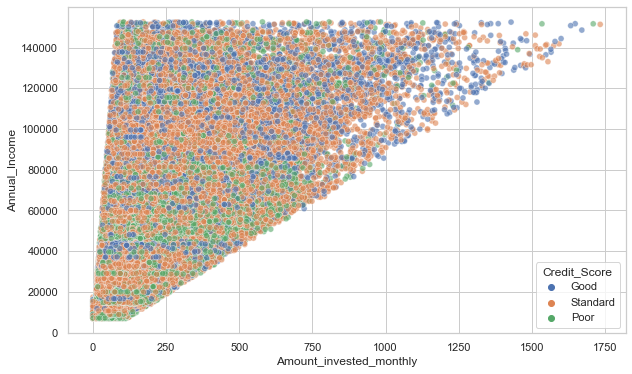

In [591]:
# Checking the scatterplot of Annual_Income and Amount_invested_monthly after handling with outliers

sns.scatterplot(x= df.Amount_invested_monthly, y=df.Annual_Income,  data=df, hue="Credit_Score", alpha=0.6);

In [592]:
# final check of descriptive values for numerical columns

df.select_dtypes(exclude="O").describe()

,ID,Customer_ID,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
count,98288.000000,98288.000000,98288.000000,98288.000000,98288.000000,98288.000000,98288.000000,98288.000000,98288.000000,98288.000000,98288.000000,98288.000000,98288.000000,98288.000000,98288.000000,98288.000000,98288.000000,98288.000000,98288.000000
mean,80638.109474,25973.456536,33.271569,48435.581991,4028.802948,5.414679,5.555643,14.670031,3.560638,21.277409,13.451510,10.465711,5.823295,1438.582303,32.226476,218.096451,89.603504,188.226332,394.003118
std,43307.782905,14341.950501,10.758208,35244.871378,2939.731793,2.583092,2.065980,8.741293,2.451700,14.880537,6.229559,6.802697,3.866079,1160.068993,5.087633,101.251989,82.501841,182.254044,200.099013
min,5634.000000,1006.000000,14.000000,7005.930000,303.645417,0.000000,0.000000,1.000000,0.000000,-5.000000,0.000000,-6.490000,0.000000,0.230000,20.000000,-1.000000,0.000000,0.000000,0.007760
25%,43101.750000,13665.000000,24.000000,19206.920000,1616.951667,4.000000,4.000000,8.000000,2.000000,10.000000,9.000000,5.390000,3.000000,573.520000,28.006847,140.000000,27.904323,73.433858,269.186083
50%,80715.500000,25772.000000,33.000000,36459.965000,3045.443333,6.000000,5.000000,13.000000,3.000000,18.000000,14.000000,9.460000,6.000000,1176.770000,32.250416,217.000000,62.733640,128.517077,334.754399
75%,118137.250000,38383.000000,42.000000,69870.880000,5817.116667,7.000000,7.000000,20.000000,5.000000,28.000000,18.000000,15.010000,9.000000,1971.130000,36.445404,299.000000,133.108077,231.040084,462.647653
max,155629.000000,50999.000000,56.000000,152574.760000,14867.813333,11.000000,11.000000,34.000000,9.000000,67.000000,28.000000,36.970000,17.000000,4998.070000,50.000000,404.000000,357.406068,1733.700474,1602.040519


### Correlation between numerical features

In [593]:
# Updating df_numeric after completion the process of handling with outliers 
df_numeric= df.select_dtypes(exclude=["object"])

#Checking the correlation between numerical features
df_numeric.corr()

,ID,Customer_ID,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
ID,1.000000,0.001902,0.003564,-0.005249,-0.005035,0.005577,-0.001060,0.003710,-0.010481,-0.005079,0.001218,0.008296,-0.002653,0.003108,-0.005325,-0.009936,-0.005929,-0.006645,0.002465
Customer_ID,0.001902,1.000000,-0.003605,0.009305,0.008871,0.000004,-0.003659,-0.003164,0.015075,0.005281,0.005266,0.000647,0.000841,0.004682,-0.002022,-0.014311,0.019191,0.010352,-0.003383
Age,0.003564,-0.003605,1.000000,0.089655,0.088409,-0.189415,-0.148021,-0.217333,-0.213946,-0.173442,-0.184094,-0.155634,-0.252858,-0.203290,0.024477,0.232573,-0.078627,0.055061,0.119687
Annual_Income,-0.005249,0.009305,0.089655,1.000000,0.997506,-0.254645,-0.204733,-0.280098,-0.243402,-0.228129,-0.248653,-0.155246,-0.264999,-0.259826,0.155951,0.250774,0.443443,0.617429,0.679524
Monthly_Inhand_Salary,-0.005035,0.008871,0.088409,0.997506,1.000000,-0.253924,-0.203661,-0.279724,-0.242031,-0.227681,-0.248257,-0.155047,-0.264906,-0.259514,0.156321,0.250039,0.441946,0.617835,0.681894
Num_Bank_Accounts,0.005577,0.000004,-0.189415,-0.254645,-0.253924,1.000000,0.441211,0.580642,0.470201,0.557363,0.596786,0.324723,0.516736,0.504983,-0.062305,-0.469955,0.113931,-0.160041,-0.284671
Num_Credit_Card,-0.001060,-0.003659,-0.148021,-0.204733,-0.203661,0.441211,1.000000,0.496868,0.417180,0.478330,0.422622,0.250433,0.460157,0.490374,-0.049150,-0.406196,0.115033,-0.133291,-0.232775
Interest_Rate,0.003710,-0.003164,-0.217333,-0.280098,-0.279724,0.580642,0.496868,1.000000,0.557119,0.585606,0.566468,0.362035,0.631431,0.627692,-0.066542,-0.560261,0.151597,-0.178950,-0.318180
Num_of_Loan,-0.010481,0.015075,-0.213946,-0.243402,-0.242031,0.470201,0.417180,0.557119,1.000000,0.498979,0.471063,0.367888,0.565564,0.638982,-0.092871,-0.593091,0.471944,-0.154828,-0.438896
Delay_from_due_date,-0.005079,0.005281,-0.173442,-0.228129,-0.227681,0.557363,0.478330,0.585606,0.498979,1.000000,0.537440,0.288075,0.538330,0.569530,-0.055819,-0.477931,0.154205,-0.146493,-0.270707


In [594]:
df.columns

Index(['ID', 'Customer_ID', 'Month', 'Name', 'Age', 'SSN', 'Occupation',
       'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt',
       'Credit_Utilization_Ratio', 'Credit_History_Age',
       'Payment_of_Min_Amount', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Monthly_Balance', 'Credit_Score'],
      dtype='object')

In [595]:
# Checking the descriptive values of numerical features by grouping Credit_Score

df.drop(columns=["ID","Customer_ID","Age"]).groupby("Credit_Score").describe().T

Credit_Score                             Good           Poor       Standard
Annual_Income            count   17056.000000   28723.000000   52509.000000
                         mean    60486.860869   39359.286863   49485.912647
                         std     39433.148232   29552.289662   35342.388775
                         min      7189.540000    7005.930000    7006.035000
                         25%     29042.270000   16720.200000   19889.440000
                         50%     43581.130000   31763.360000   36446.720000
                         75%     89165.977500   57303.360000   71689.680000
                         max    152483.320000  152574.760000  152574.760000
Monthly_Inhand_Salary    count   17056.000000   28723.000000   52509.000000
                         mean     5015.680929    3280.716813    4117.456078
                         std      3287.885890    2470.961721    2948.756734
                         min       332.128333     319.556250     303.645417
                         25%      2362.823125    1392.871667    1670.771667
                         50%      3658.825833    2636.685000    3058.996667
                         75%      7417.443333    4751.372500    5971.776667
                         max     14867.813333   14839.700000   14867.813333
Num_Bank_Accounts        count   17056.000000   28723.000000   52509.000000
                         mean        3.470685       6.564147       5.417357
                         std         2.237802       2.484298       2.353042
                         min         0.000000       0.000000       0.000000
                         25%         2.000000       5.000000       4.000000
                         50%         3.000000       7.000000       5.000000
                         75%         5.000000       8.000000       7.000000
                         max        10.000000      11.000000      11.000000
Num_Credit_Card          count   17056.000000   28723.000000   52509.000000
                         mean        4.156719       6.640671       5.416519
                         std         1.818664       1.986641       1.859389
                         min         0.000000       1.000000       0.000000
                         25%         3.000000       5.000000       4.000000
                         50%         4.000000       7.000000       5.000000
                         75%         5.000000       8.000000       7.000000
                         max        10.000000      11.000000      11.000000
Interest_Rate            count   17056.000000   28723.000000   52509.000000
                         mean        7.705441      20.314347      13.844769
                         std         4.928692       8.806085       7.671733
                         min         1.000000       1.000000       1.000000
                         25%         4.000000      15.000000       8.000000
                         50%         7.000000      21.000000      13.000000
                         75%        11.000000      28.000000      18.000000
                         max        34.000000      34.000000      34.000000
Num_of_Loan              count   17056.000000   28723.000000   52509.000000
                         mean        2.210190       4.781638       3.331391
                         std         1.664633       2.429053       2.379785
                         min         0.000000       0.000000       0.000000
                         25%         1.000000       3.000000       2.000000
                         50%         2.000000       5.000000       3.000000
                         75%         3.000000       7.000000       5.000000
                         max         9.000000       9.000000       9.000000
Delay_from_due_date      count   17056.000000   28723.000000   52509.000000
                         mean       11.028670      29.898513      19.890571
                         std         8.563485      16.293092      12.990626
                         min        -5.000000   

In [596]:
# Checking the correlation between numerical features by grouping Credit_Score

df.drop(columns=["ID","Customer_ID","Age"]).groupby("Credit_Score").corr()

Annual_Income  Monthly_Inhand_Salary  \
Credit_Score                                                                  
Good         Annual_Income                  1.000000               0.996753   
             Monthly_Inhand_Salary          0.996753               1.000000   
             Num_Bank_Accounts             -0.117650              -0.121153   
             Num_Credit_Card               -0.054992              -0.056840   
             Interest_Rate                 -0.061771              -0.066544   
             Num_of_Loan                   -0.062550              -0.062277   
             Delay_from_due_date           -0.079797              -0.086107   
             Num_of_Delayed_Payment        -0.129059              -0.133103   
             Changed_Credit_Limit          -0.063285              -0.064154   
             Num_Credit_Inquiries          -0.060267              -0.064974   
             Outstanding_Debt              -0.070605              -0.072718   
             Credit_Utilization_Ratio       0.169579               0.170097   
             Credit_History_Age             0.038720               0.040027   
             Total_EMI_per_month            0.470209               0.468146   
             Amount_invested_monthly        0.613745               0.612349   
             Monthly_Balance                0.642865               0.645940   
Poor         Annual_Income                  1.000000               0.997107   
             Monthly_Inhand_Salary          0.997107               1.000000   
             Num_Bank_Accounts             -0.265913              -0.264786   
             Num_Credit_Card               -0.175498              -0.173756   
             Interest_Rate                 -0.306933              -0.307134   
             Num_of_Loan                   -0.227577              -0.226344   
             Delay_from_due_date           -0.171315              -0.170499   
             Num_of_Delayed_Payment        -0.243997              -0.243314   
             Changed_Credit_Limit          -0.103260              -0.104781   
             Num_Credit_Inquiries          -0.279873              -0.279478   
             Outstanding_Debt              -0.253023              -0.252939   
             Credit_Utilization_Ratio       0.127740               0.128320   
             Credit_History_Age             0.274045               0.274153   
             Total_EMI_per_month            0.515780               0.512881   
             Amount_invested_monthly        0.604565               0.605695   
             Monthly_Balance                0.649765               0.653968   
Standard     Annual_Income                  1.000000               0.997791   
             Monthly_Inhand_Salary          0.997791               1.000000   
             Num_Bank_Accounts             -0.192758              -0.192740   
             Num_Credit_Card               -0.151844              -0.152031   
             Interest_Rate                 -0.213117              -0.213666   
             Num_of_Loan                   -0.208190              -0.207844   
             Delay_from_due_date           -0.186672              -0.187042   
             Num_of_Delayed_Payment        -0.192325              -0.192511   
             Changed_Credit_Limit          -0.159918              -0.159588   
             Num_Credit_Inquiries          -0.209746              -0.210608   
             Outstanding_Debt              -0.218094              -0.218807   
             Credit_Utilization_Ratio       0.155718               0.156012   
             Credit_History_Age             0.206841               0.206810   
             Total_EMI_per_month            0.454516               0.452731   
             Amount_invested_monthly        0.608288               0.609494   
             Monthly_Balance                0.681486               0.683463   

                                       Num_Bank_Accounts  Num_Credit_Card  \
Credit_Scor

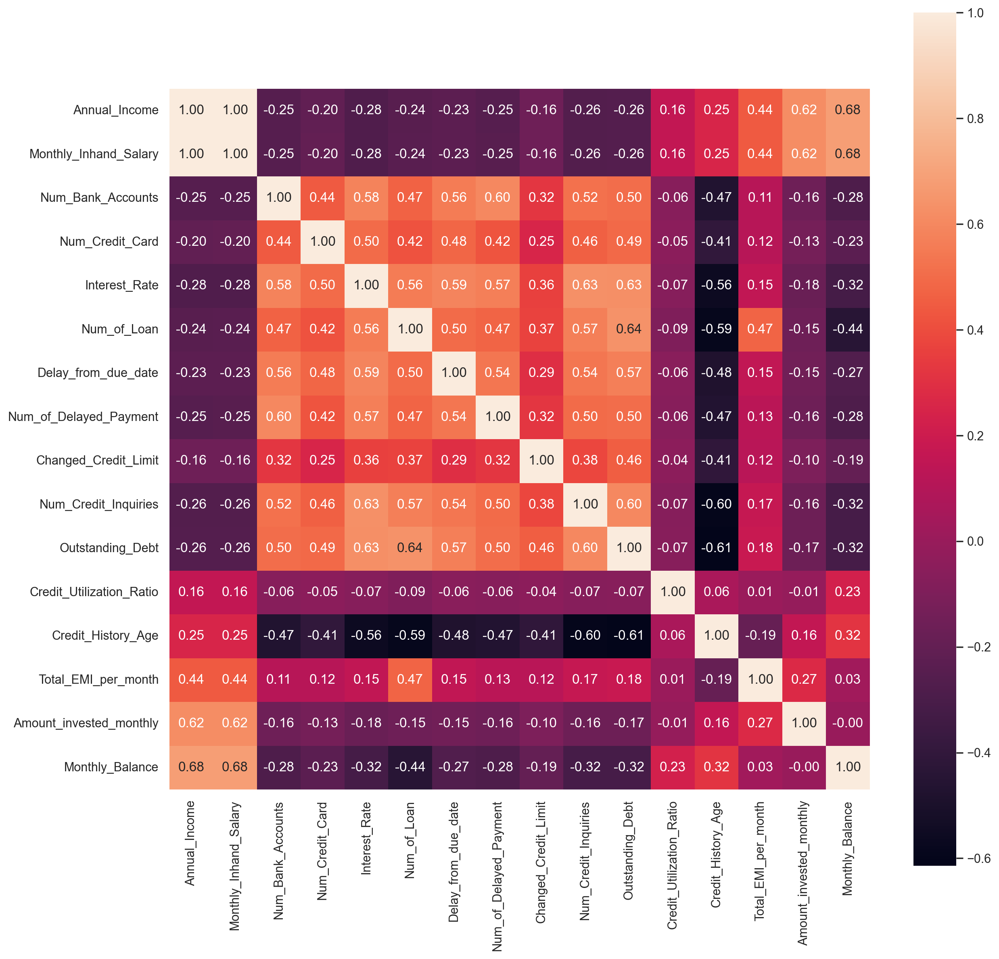

In [597]:
# Checking the correlation between numerical features for all Credit_Score

plt.figure(figsize=(14,14),dpi=200)
sns.heatmap(df.drop(columns=["ID","Customer_ID","Age"]).corr(), square=True, annot=True, fmt=".2f");

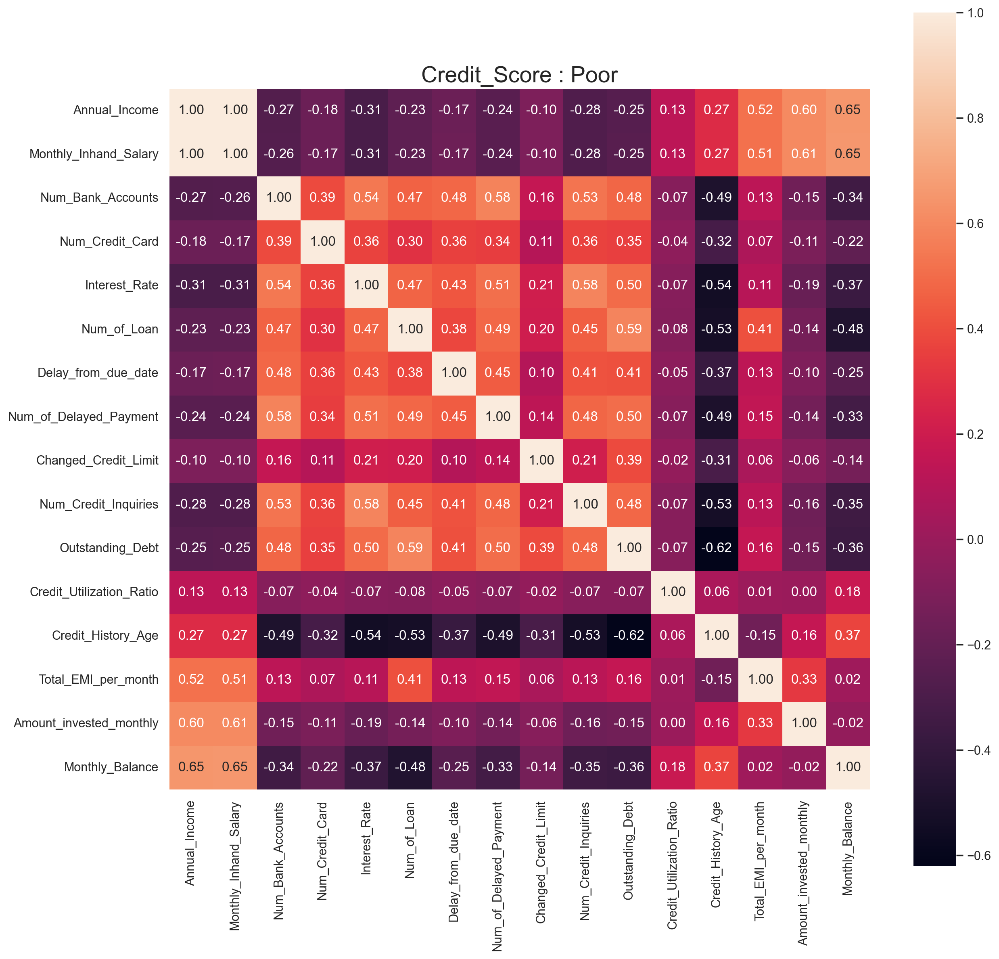

In [598]:
# Checking the correlation between numerical features for Poor Credit_Score

plt.figure(figsize=(14,14),dpi=200)
sns.heatmap(df.drop(columns=["ID","Customer_ID","Age"])[df.Credit_Score=="Poor"].corr(), square=True, annot=True, fmt=".2f");
plt.title("Credit_Score : Poor", fontsize=20);

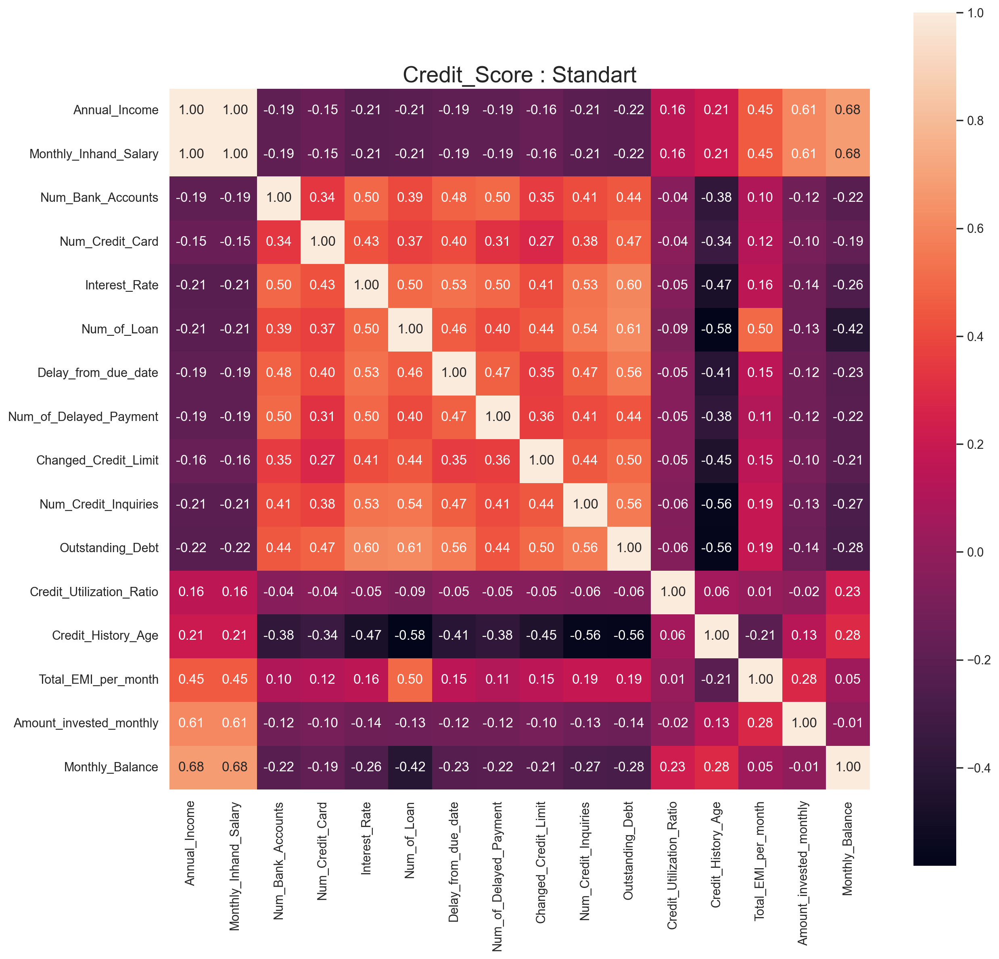

In [599]:
# Checking the correlation between numerical features for Standard Credit_Score

plt.figure(figsize=(14,14),dpi=200)
sns.heatmap(df.drop(columns=["ID","Customer_ID","Age"])[df.Credit_Score=="Standard"].corr(), square=True, annot=True, fmt=".2f");
plt.title("Credit_Score : Standart", fontsize=20);

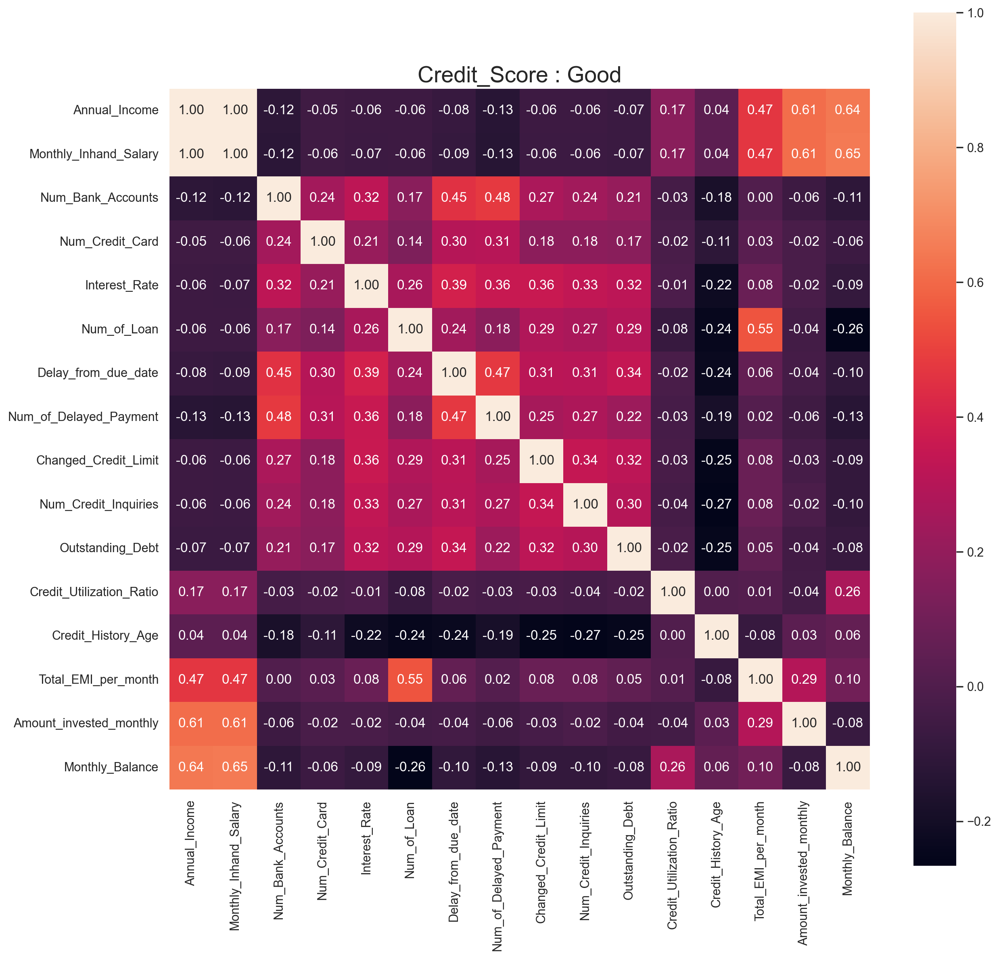

In [600]:
# Checking the correlation between numerical features for Good Credit_Score

plt.figure(figsize=(14,14),dpi=200)
sns.heatmap(df.drop(columns=["ID","Customer_ID","Age"])[df.Credit_Score=="Good"].corr(), square=True, annot=True, fmt=".2f");
plt.title("Credit_Score : Good", fontsize=20);

### Conclusion about numerical features

When we compared the correlation between numerical features for different Credit_Scores, it can be concluded that;

* There are strongly positive correlation between Annual_Income and Monthly_Inhand_Salary for all Credit_Score values. Therefore one of them can be dropped for further analysis.
* The correlation between Num_Bank_Accounts, Num_Credit_Card, Interest_Rate, Num_of_Loan, Delay_from_due_date, Num_of_Delayed_Payment, Num_Credit_Inquiries, Outstanding_Debt and Annual_Income/Monthly_Inhand_Salary is weakly negative. Also it decreases with changing Credit_Score from Poor to Good.
* The correlation between Credit_Utilization_Ratio and Annual_Income/Monthly_Inhand_Salary is weakly positive and it increases with changing Credit_Score from Poor to Good.
* The correlation between Credit_History_Age and Annual_Income/Monthly_Inhand_Salary is weakly positive and it decreases with changing Credit_Score from Poor to Good.
* The correlation between Total_EMI_per_month and Annual_Income/Monthly_Inhand_Salary is moderately positive and it decreases with changing Credit_Score from Poor to Good.
* The correlation between Amount_invested_monthly and Annual_Income is moderately positive and it is same for the Credit_Score Poor and Standar, but it is decreasing in Good Credit_Score.
* The correlation between Amount_invested_monthly and Monthly_Inhand_Salary is moderately positive and it is almost the same for the Poor, Standar and Good Credit_Scores.
* The correlation between Monthly_Balance and Annual_Income/Monthly_Inhand_Salary is moderately positive and it is decreasing from the Poor to Good Credit_Scores.
* The correlation between Num_Credit_Card, Interest_Rate, Num_of_Loan, Delay_from_due_date, Num_of_Delayed_Payment, Num_Credit_Inquiries, Outstanding_Debt and Num_Bank_Accounts is moderately positive and it is decreasing from the Poor to Good Credit_Scores.
* The correlation between Interest_Rate, Num_of_Loan, Delay_from_due_date, Num_of_Delayed_Payment, Num_Credit_Inquiries, Outstanding_Debt and Num_Credit_Card is moderately positive and it is increasing from the Poor to Standart Credit_Score but decreasing from Standart to Good Credit_Score.
* The correlation between Num_Bank_Accounts, Num_of_Delayed_Payment, Num_Credit_Inquiries and Interest_Rate  is moderately positive and decreasing from Poor to Good Credit_Score.
* The correlation between Outstanding_Debt and Interest_Rate is moderately positive and decreasing from Poor to Good Credit_Score. Although it increases slightly when Credit_Score changes from Poor to Standard, it decreases significantly when Credit_Score changes from Standard to Good.
* The correlation between Num_Bank_Accounts, Num_Credit_Card, Interest_Rate, Delay_from_due_date, Num_of_Delayed_Payment, Changed_Credit_Limit, Num_Credit_Inquiries, Outstanding_Debt and Num_of_Loan are moderately positive and it decreases when Credit_Score changes from Standart to Good.
* The correlation between Delay_from_due_date, Num_of_Delayed_Payment and Num_Bank_Accounts is moderately positive and it is decreases when Credit_Score changes from Poor to Good.
* The correlation between Delay_from_due_date and Num_of_Delayed_Payment is moderately positive and it is almost the same for all Credit_Scores.
* The correlation between Num_of_Loan, Delay_from_due_date, Num_of_Delayed_Payment and Outstanding_Debt is moderately positive and it decreases when Credit_Score changes from Poor to Good.
* The correlation between Num_of_Loan and Total_EMI_per_month is moderately positive and it increases when Credit_Score changes from Poor to Good.
* There are moderately positive correlation between Annual_Income, Monthly_Inhand_Salary and Total_EMI_per_month and it decreases when Credit_Score changes from Poor to Good.
* There are moderately positive correlation between Annual_Income, Monthly_Inhand_Salary and Amount_invested_monthly and it is almost the same for all Credit_Scores.
* There are moderately positive correlation between Annual_Income, Monthly_Inhand_Salary and Monthly_Balance and it decreases when Credit_Score changes from Poor to Good. 


In [601]:
df.drop(columns="Monthly_Inhand_Salary", inplace=True)

In [602]:
df.shape

(98288, 25)

## Handling with outliers for categorical features

In [603]:
df_categorical = df[['Occupation', 'Credit_Mix', 'Payment_of_Min_Amount', 'Credit_Score']]

In [604]:
df_categorical.columns

Index(['Occupation', 'Credit_Mix', 'Payment_of_Min_Amount', 'Credit_Score'], dtype='object')

In [605]:
df_categorical.describe()

,Occupation,Credit_Mix,Payment_of_Min_Amount,Credit_Score
count,98288,98288,98288,98288
unique,15,3,3,3
top,Lawyer,Standard,Yes,Standard
freq,6984,45848,52326,52509


### Countplot for categorical features

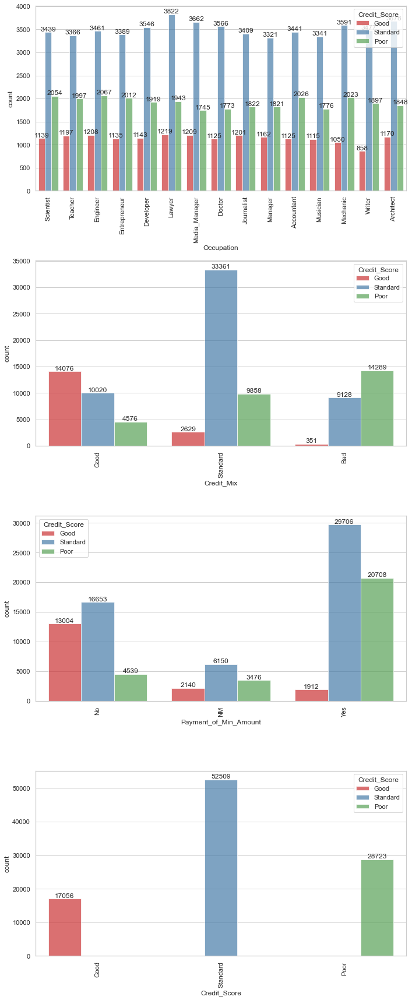

In [606]:
fig, axes = plt.subplots(len(df_categorical.columns ), 1, figsize=(10, 24))

for i, ax in enumerate(fig.axes):
    # plot barplot of each feature
    if i < len(df_categorical.columns):
        ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=90)
        g = sns.countplot(x=df_categorical.columns[i], alpha=0.7, hue=df_categorical.Credit_Score, data=df_categorical, ax=ax, palette = "Set1")
        for i in ax.containers:
            g.bar_label(i)
fig.tight_layout();

## Payment of Min_Amount feature

In [607]:
# Checking the value counts of Payment_of_Min_Amount

df.Payment_of_Min_Amount.value_counts()

Yes    52326
No     34196
NM     11766
Name: Payment_of_Min_Amount, dtype: int64

In [608]:
# Replacing the "NM" with np.nan
df.Payment_of_Min_Amount.replace("NM", np.nan, inplace=True)

In [609]:
df.Payment_of_Min_Amount.value_counts(dropna=False)

Yes    52326
No     34196
NaN    11766
Name: Payment_of_Min_Amount, dtype: int64

In [610]:
# Checking the value counts of Payment_of_Min_Amount column by grouping Customer_ID

df.groupby("Customer_ID")["Payment_of_Min_Amount"].value_counts(dropna=False)

Customer_ID  Payment_of_Min_Amount
1006         Yes                      8
1007         No                       8
1008         Yes                      7
             NaN                      1
1009         Yes                      8
                                     ..
50984        NaN                      1
50990        Yes                      8
50992        Yes                      8
50996        Yes                      8
50999        No                       8
Name: Payment_of_Min_Amount, Length: 20151, dtype: int64

In [611]:
# Filling the null values in Payment_of_Min_Amount column with ffill and bfill method

df["Payment_of_Min_Amount"] = df.groupby("Customer_ID")["Payment_of_Min_Amount"].fillna(method="ffill").fillna(method="bfill")

In [612]:
df.Payment_of_Min_Amount.value_counts(dropna=False)

Yes    59432
No     38856
Name: Payment_of_Min_Amount, dtype: int64

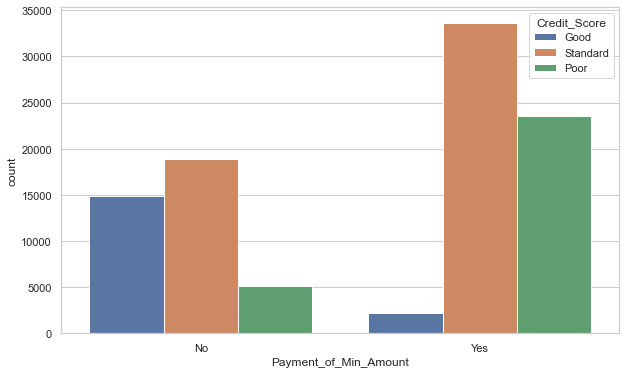

In [613]:
# countplot of Payment_of_Min_Amount column for different Credit_Scores

sns.countplot(x=df.Payment_of_Min_Amount, hue=df.Credit_Score);

## Chi square test for Credit_Mix and Credit_Score columns

In [614]:
# Null hypothesis H₀: whether Credit_Mix and Credit_Score are independent
# Alternative hypothesis H₁: whether Credit_Mix and Credit_Score are independent dependent
# α = 0.05

# create contingency table
data_crosstab = pd.crosstab(df['Credit_Mix'],
                            df['Credit_Score'],
                           margins=True, margins_name="Total")

# significance level
alpha = 0.05

# Calcualtion of Chisquare
chi_square = 0
rows = df['Credit_Mix'].unique()
columns = df['Credit_Score'].unique()
for i in columns:
    for j in rows:
        O = data_crosstab[i][j]
        E = data_crosstab[i]['Total'] * data_crosstab['Total'][j] / data_crosstab['Total']['Total']
        chi_square += (O-E)**2/E

# The p-value approach
print("Approach 1: The p-value approach to hypothesis testing in the decision rule")
p_value = 1 - stats.chi2.cdf(chi_square, (len(rows)-1)*(len(columns)-1))
conclusion = "Failed to reject the null hypothesis."
if p_value <= alpha:
    conclusion = "Null Hypothesis is rejected."
        
print("chisquare-score is:", chi_square, " and p value is:", p_value)
print(conclusion)
    
# The critical value approach
print("\n--------------------------------------------------------------------------------------")
print("Approach 2: The critical value approach to hypothesis testing in the decision rule")
critical_value = stats.chi2.ppf(1-alpha, (len(rows)-1)*(len(columns)-1))
conclusion = "Failed to reject the null hypothesis."
if chi_square > critical_value:
    conclusion = "Null Hypothesis is rejected."
        
print("chisquare-score is:", chi_square, " and critical value is:", critical_value)
print(conclusion)

Approach 1: The p-value approach to hypothesis testing in the decision rule
chisquare-score is: 40135.46443448077  and p value is: 0.0
Null Hypothesis is rejected.

--------------------------------------------------------------------------------------
Approach 2: The critical value approach to hypothesis testing in the decision rule
chisquare-score is: 40135.46443448077  and critical value is: 9.487729036781154
Null Hypothesis is rejected.


After performing the Chi-squared test for Credit_Mix and Credit_Score, we see that there is strong co-dependency for each of these variables. Since highly dependent/correlated variables do not add much relevant new information with regards to the value of the target feature, we will drop Credit_Mix feature from the dataset.

In [615]:
df.drop(columns="Credit_Mix", inplace=True)

In [616]:
df.shape

(98288, 24)

## Dropping unnecessary features

In [617]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 98288 entries, 0 to 99999
Data columns (total 24 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ID                        98288 non-null  int64  
 1   Customer_ID               98288 non-null  int64  
 2   Month                     98288 non-null  object 
 3   Name                      98288 non-null  object 
 4   Age                       98288 non-null  int32  
 5   SSN                       98288 non-null  object 
 6   Occupation                98288 non-null  object 
 7   Annual_Income             98288 non-null  float64
 8   Num_Bank_Accounts         98288 non-null  float64
 9   Num_Credit_Card           98288 non-null  float64
 10  Interest_Rate             98288 non-null  float64
 11  Num_of_Loan               98288 non-null  float64
 12  Delay_from_due_date       98288 non-null  int64  
 13  Num_of_Delayed_Payment    98288 non-null  float64
 14  Change

Since ID, Customer_ID, Month, Name, SSN columns will not add much relevant new information with regards to the value of target feature, we will drop these features from the dataset.

In [618]:
df.drop(columns=["ID", "Customer_ID", "Month", "Name", "SSN"], inplace=True)

In [619]:
df.shape

(98288, 19)

# Final Evaluation of Data via Graphs

## Histplots for numerical features

In [623]:
df_numeric = df.select_dtypes(exclude="O")

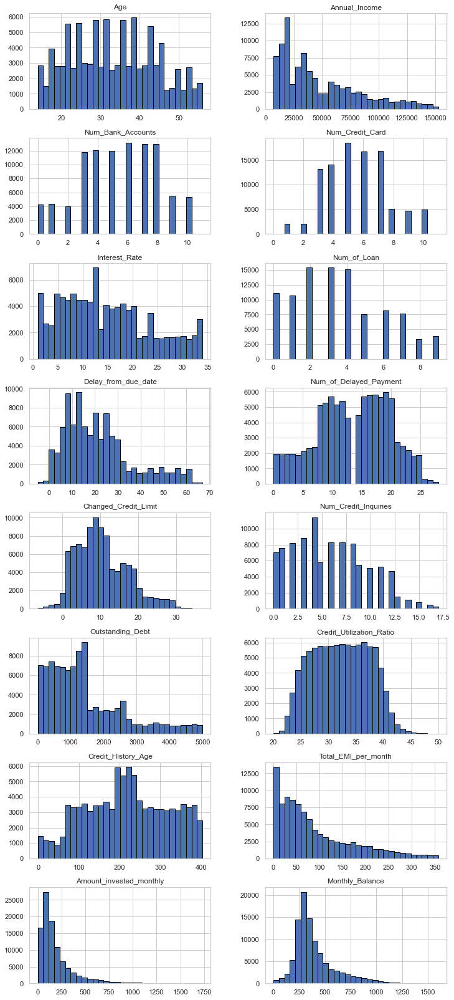

In [627]:
fig_ = df_numeric.hist(figsize=(12, 36), layout=(10,2), bins=30, edgecolor="black");

## Boxplots for numeric columns for different Credit Scores

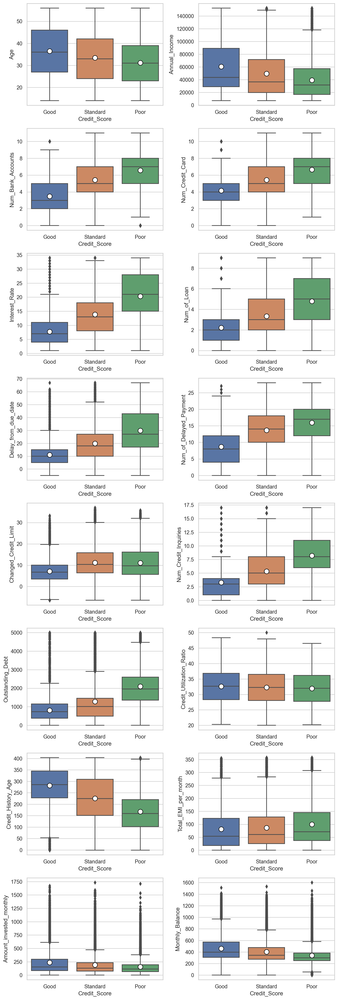

In [626]:
fig = plt.figure(figsize=(10,36), dpi=200)
for i, col in enumerate(df.select_dtypes(exclude="O").columns):
        plt.subplot(10,2,i+1)
        sns.boxplot(x= "Credit_Score", y=col, data=df,
                    showmeans=True,
                    meanprops={"marker":"o",
                       "markerfacecolor":"white", 
                       "markeredgecolor":"black",
                      "markersize":"10"})
plt.tight_layout();

## Countplot of categorical features for different Credit_Scores

In [417]:
df_categorical = df.select_dtypes(include="O")

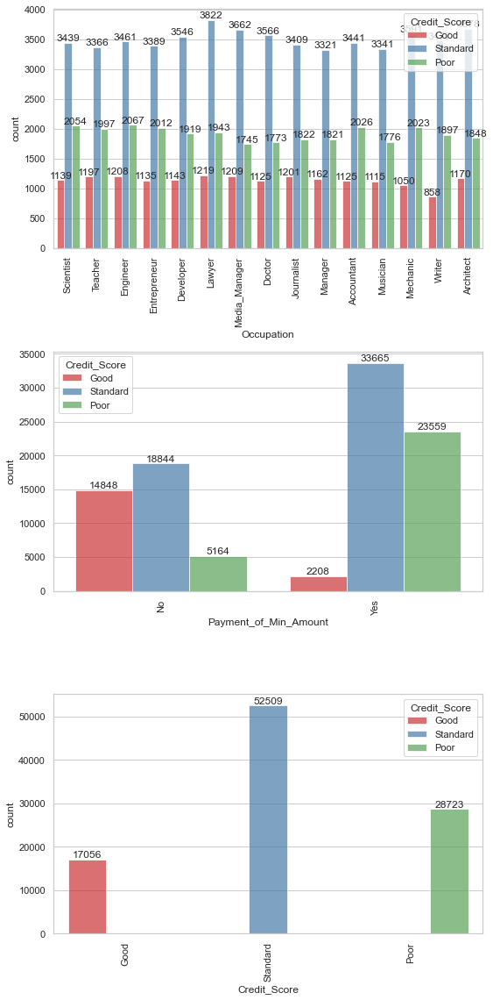

In [420]:
fig, axes = plt.subplots(len(df_categorical.columns ), 1, figsize=(8, 16))

for i, ax in enumerate(fig.axes):
    # plot barplot of each feature
    if i < len(df_categorical.columns):
        ax.set_xticklabels(ax.xaxis.get_majorticklabels(), rotation=90)
        g = sns.countplot(x=df_categorical.columns[i], alpha=0.7, hue=df_categorical.Credit_Score, data=df_categorical, ax=ax, palette = "Set1")
        for i in ax.containers:
            g.bar_label(i)
fig.tight_layout();

## Conclusion about features for different Credit_Scores

* When we compare age values for different Credit_Scores, it can be seen that the credit score improves as as the mean and median values of age increase.
* The most of the Customers in the dataset have greater Annual_Income value for Standart and Good credit scores and the credit score improves as the mean/median values of Annual_Income increase.
* The mean/median values of Num_Bank_Accounts, Num_Credit_Card, Interest_Rate, Num_of_Loan, Delay_from_due_date, Num_of_Delayed_Payment, Changed_Credit_Limit, Num_Credit_Inquiries, Outstanding_Debt and Total_EMI_per_month features increase as the credit scores change from Good to Poor.
* The mean/median values of Credit_Utilization_Ratio are almost the same for all credit scores.
* The mean/median values of Credit_History_Age decrease as the credit scores change from Good to Poor.
* The mean/median values of Total_EMI_per_month slightly increase as the credit scores change from Good to Poor.
* The mean/median values of Amount_invested_monthly and Monthly_Balance slightly decrease as the credit scores change from Good to Poor.
* The number of customer distributed is almost equally for each occupation in different credit scores. At the good credit score the number of customers is lowest although it is highest at the standart credit score.
* The number of customers having Payment_of_Min_Amount is higher at Poor and Standart credit scores while the number of customers with No Payment_of_Min_Amount is higher at Good credit score.